# [AIFFEL_Going Deeper_4] 인물사진을 만들어 보자

## 프로젝트 내용
인물 모드 사진을 만들고, 문제점을 찾아 개선 방안 도출하기

## 목차
#### <span style = "color:red;">1. 인물 모드 사진 만들기</span>
**- Step 1. 필요한 라이브러리 불러오기**    
**- Step 2. 인물모드 직접 구현하기_최소 3장 이상의 인물모드 사진 만들기**        
2-1. 1번째 사진_사진 불러오기      
2-2. PixelLib에서 제공해 주는 모델 다운로드     
2-3. semantic_segmention 모델 객체 생성     
2-4. 모델에 이미지 입력해 Segmentation(이미지 분할) 진행     
2-5. PASCAL VOC 데이터의 라벨 종류 확인     
2-6. colormap 만들기     
2-7. seg_color로 이루어진 마스크 만들기     
2-8. 원본 이미지와 겹쳐서 확인하기(cv2.addWeighted() 이용)     
2-9. 배경 흐리게 만들기(blur() 이용)     
2-10. 배경 영상과 사람 영상을 합치기   
2-11. 2번째 사진    
2-12. 3번째 사진    
**- Step 3. 인물이 주인공이 아닌, 다른 대상에 대한 아웃포커싱 사진 만들기**                    
3-1. 4번째 사진_마네킹    
3-2. 5번째 사진_마네킹 다수, 사람 다수     
3-3. 6번째 사진_마네킹 하나, 사람 한 명     
3-4. 7번째 사진_동물(소) 그림 반 사진 반     
3-5. 8번째 사진_동물(소) 그림으로 그린 전체 소 하나, 실제 소 전체 사진 하나     
3-6. 9번째 사진_동물(소) 다른 소 모습_그림으로 그린 전체 소 하나, 실제 소 전체 사진 하나      
**- Step 4. 배경사진을 다른 이미지 합성_10번째 사진_동물 소 + 다른 배경 합치기**           
4-1. 소만 이미지에서 분류     
4-2. 양탄자 이미지 불러오고 소와 합치기     
4-3. 양탄자 이미지에 패딩을 해 이미지 shape 맞추기(np.pad() 사용)     
4-4. 양탄자 이미지를 resize(PIL image.resize() 사용)        
#### <span style = "color:red;">2. 만든 인물 모드 사진의 문제점 찾기</span>        
#### <span style = "color:red;">3. 개선 방안 고민 및 도출</span>           
**- Step 1. Xception을 적용해볼 수 있지 않을까?**             
**- Step 2. DeepLabV3 model이 특정부분을 잘 인식하지 못할 때의 이유에 대해 알아봄**      
**- Step 3. 데이터 후처리에서 dilation, erosion에 주목, 팽창/침식 연산을 적용해 볼 수 있지 않을까?**            
3-1. 원본이미지에서 침식 연산 적용           
3-2. segmentation된 mask와 원본이미지를 합성한 이미지에서 침식 연산 적용      
3-2-1. ndarray를 PIL Image로 format 변환      
3-2-2. PIL Image로 format을 변환 후 저장시 no directory 문제      
3-2-3. 디렉토리를 만들어보자, os.makedirs()로 가능      
3-2-4. 새로 만든 디렉토리에 저장      
3-2-5. 디렉토리에 저장한 PIL Image로 침식 연산 진행      
3-2-6. cv2.cvtColor을 통해 색을 바꿔서 출력 시도      
3-2-7. cmap을 적용하지 않고 출력      
3-3. 흑백으로 나오는 segmentation된 mask 이미지로 침식 연산 수행      
3-3-1. segmentation된 mask 이미지 침식 연산의 mask 크기 조절      
3-3-2. 1x1 mask를 적용한 침식 연산 img_mask과 segmentation된 색 반전 사진과 합치기      
3-3-3. 1x1 mask를 적용한 침식 연산 img_mask과 blurred img와 합치기       
3-3-4. 7x7 mask를 적용한 침식 연산 img_mask과 blurred img와 합치기       
3-4. 흑백으로 나오는 segmentation된 mask 이미지로 팽창 연산 수행      
3-5. 문제점 개선에 영향이 있었던 팽창 연산 flow chart 정리    
#### 4. 결론      
#### 5. 루브릭 관련 고려한 점     
#### 6. 회고          
#### 7. References         

## 글씨 색 표시
### <span style = "color:orange;">- 노랑: 질문! or 짚고가자!</span>    
### <span style = "color:red;">- 빨강: 중요 or 특이사항</span>

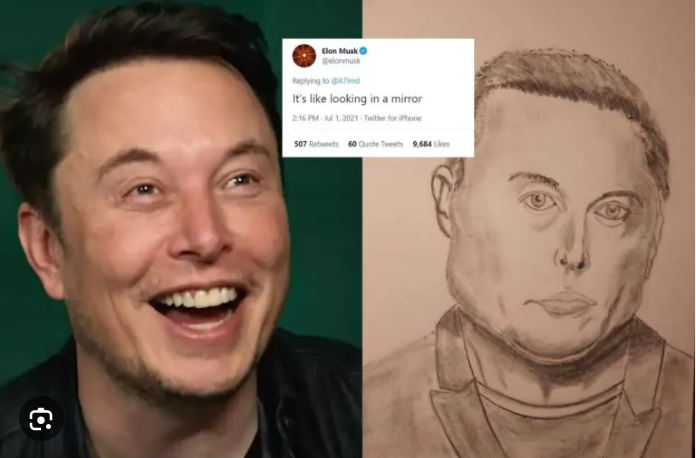

In [34]:
Image("[GD_4_Portrait] images/11.PNG")

# 1. 인물 모드 사진 만들기

## Step 1. 필요한 라이브러리 불러오기

In [1]:
import os
import urllib
import cv2 
import numpy as np
import pixellib

from pixellib.semantic import semantic_segmentation
from matplotlib import pyplot as plt
from importlib.metadata import version

print(cv2.__version__)
print(version('pixellib'))

4.5.3
0.7.1


In [1]:
!pip install IPython  
from IPython.display import Image

### <span style = "color:orange;">라이브러리 공부!</span>

  
<span style = "color:red;">import os</span>    
os 모듈은 Operating System의 약자로서 운영체제에서 제공되는 여러 기능을 파이썬에서 수행할 수 있게 해준다.    
예를 들어, 파이썬을 이용해 파일을 복사하거나 디렉터리를 생성하고 특정 디렉터리 내의 파일 목록을 구하고자 할 때 사용한다.    
https://wikidocs.net/3141


<span style = "color:red;">import urllib</span>      
urllib은 URL 처리에 관련된 모듈을 모아 놓은 패키지    
https://dojang.io/mod/page/view.php?id=2442


<span style = "color:red;">import cv2</span>     
OpenCV라이브러리    
컴퓨터 비전 관련 프로그래밍을 쉽게 할 수 있도록 도와주는 라이브러리     


<span style = "color:red;">import pixellib</span>     
Pixellib는 파이썬 라이브러리이다.    
픽셀 수준의 image segmentation(이미지 분할)과 object detection(객체 탐색)을 할 수 있게 하는 고수준의 API를 제공한다.    
TensorFlow 프레임워크 위에서 작동하며, 더 정확하고 효과적인 결과를 얻기 위해 pre-trained 모델을 활용한다. 

Pixellib is a Python library that provides a high-level API for performing pixel-level image segmentation and object detection tasks.     
It is built on top of the TensorFlow framework and utilizes pre-trained models to achieve accurate and efficient results.
[ChatGPT]
          

<span style = "color:red;">from importlib.metadata import version</span>

**importlib**     
사용자가 파이썬의 import 시스템과 상호작용하기 위한 API를 제공하는 내장 라이브러리    
사용자는 import 함수의 구현 내용과, 실행에 필요한 하위 함수들을 이용해 필요에 맞는 임포터를 직접 구현하거나 임포트 관련 기능들을 자유롭게 사용할 수 있다.


**importlib.metadata**    
설치된 패키지 메타 데이터에 대한 접근을 제공하는 라이브러리      
importlib.metadata 안에 있는 version() 함수를 이용하여 pixellib 라이브러리의 버전을 확인    
[출처_노드]

## Step 2. 인물모드 직접 구현하기_최소 3장 이상의 인물모드 사진 만들기

## Step 2-1. 1번째 사진_사진 불러오기

(563, 1000, 3)


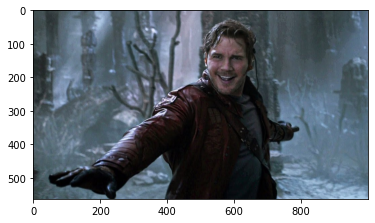

In [8]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2-2. PixelLib에서 제공해 주는 모델 다운로드

In [9]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 

# PixelLib가 제공하는 모델 url
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

# 다운로드 시작
urllib.request.urlretrieve(model_url, model_file) 

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f74b1060c40>)

### <span style = "color:orange;">함수 공부!</span>

<span style = "color:red;">os.getenv()</span>           
os 모듈에 있는 getenv() 함수를 이용해 읽고 싶은 파일의 경로를 변수에 저장할 수 있다.     
-> 이미지 파일의 경로를 이용하여 이미지 파일을 읽음    
환경 변수x의 값을 포함하는 문자열 변수를 반환한다.     
예) model_dir 에 "/aiffel/human_segmentation/models" 저장    

<span style = "color:red;">os.path.join(a, b)</span>      
경로를 병합하여 새 경로 생성     
예) model_file 에 "/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5" 저장    

<span style = "color:red;">cv2.imread(경로)</span>      
경로에 해당하는 이미지 파일을 읽어서 변수에 저장     

<span style = "color:red;">urllib.request.urlretrieve(model_url, model_file) </span>      
urllib 패키지 내에 있는 request 모듈의 urlretrieve 함수를 이용해    
model_url에 있는 파일을 다운로드 해 model_file 파일명으로 저장    
[출처_노드]

## Step 2-3. semantic_segmention 모델 객체 생성

In [10]:
model = semantic_segmentation() 
#PixelLib 라이브러리에서 클래스를 가져와 semantic segmentation을 수행하는 클래스 인스턴스 만듦

model.load_pascalvoc_model(model_file) 
# pascal voc에 대해 훈련된 예외 모델(model_file)을 로드하는 함수 호출

## Step 2-4. 모델에 이미지 입력해 Segmentation(이미지 분할) 진행

In [11]:
segvalues, output = model.segmentAsPascalvoc(img_path)

# segmentAsPascalvoc()함수를 호출하여 입력된 이미지를 분할
# segvalus, output으로 나누어 분할 출력의 배열을 가져옴
# 분할은 pacalvoc 데이터로 학습된 모델을 이용

### <span style = "color:red;">segvalues, output을 각각 출력해보면</span>      
**segvalues**는     
segmentAsPascalvoc() 함수를 호출해 이미지를 분할한 뒤 결과값 중 배열값을 출력한 것    
segvalues는 class_ids와 masks으로 구성되어 있다.     
class_ids를 통해서는 Pascal Voc의 라벨데이터와 비교해서 분할한 이미지에 어떤 라벨들이 담겨있는지 알 수 있다.    

**output**에는 segmentation된 결과가 각각 다른 색상을 의미하는 숫자로 담겨져 있다.
[출처_노드]

In [12]:
segvalues

{'class_ids': array([ 0, 15]),
 'masks': array([[False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        ...,
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False],
        [False, False, False, ..., False, False, False]])}

In [13]:
output

array([[[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       ...,

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]],

       [[0, 0, 0],
        [0, 0, 0],
        [0, 0, 0],
        ...,
        [0, 0, 0],
        [0, 0, 0],
        [0, 0, 0]]], dtype=uint8)

In [21]:
output.shape

(563, 1000, 3)

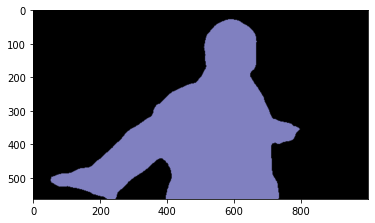

In [15]:
# output에는 segmentation된 결과가 각각 다른 색상을 의미하는 숫자로 담겨져 있다.
# 이를 matplotlib을 이용해 출력

plt.imshow(output)
plt.show()

## Step 2-5. PASCAL VOC 데이터의 라벨 종류 확인

In [14]:
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

### <span style = "color:red;">LABEL_NAMES를 자세히 보면</span> 
background를 제외하면 20개의 클래스가 있다.         
인덱스 번호 20의 의미는 tv(0부터 시작하므로)    

input으로 넣은 이미지의 사람(person) 라벨은 15에 해당    
[출처_노드]

In [16]:
#segvalues 안의 class_ids 값을 통해 pacalvoc에 담겨있는 라벨 출력

for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


## Step 2-6. colormap 만들기

In [17]:
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 colormap 출력

array([[  0,   0,   0],
       [128,   0,   0],
       [  0, 128,   0],
       [128, 128,   0],
       [  0,   0, 128],
       [128,   0, 128],
       [  0, 128, 128],
       [128, 128, 128],
       [ 64,   0,   0],
       [192,   0,   0],
       [ 64, 128,   0],
       [192, 128,   0],
       [ 64,   0, 128],
       [192,   0, 128],
       [ 64, 128, 128],
       [192, 128, 128],
       [  0,  64,   0],
       [128,  64,   0],
       [  0, 192,   0],
       [128, 192,   0]])

### <span style = "color:red;">colormap을 보고</span> 
PixelLib에 따르면 각 라벨별 해당하는 색은 위와 같다.    
사람을 나타내는 색상을 알고 싶은 경우에는 인덱스 번호를 이용하면 된다.    
person은 LABEL_NAMES에서 인덱스 번호 15에 해당하므로, colormap[15]로 사람에 해당하는 컬러맵의 색상값을 알 수 있다.    

**output 이미지가 BGR 순서로 되어있고, colormap은 RGB 순서**    
코드에 적용할 때에는 colormap에서 나온 RGB 순서를 BGR 순서로 수정해야 한다.

In [18]:
colormap[15] 

array([192, 128, 128])

In [19]:
seg_color = (128,128,192) 

### <span style = "color:orange;">seg_color를 설정할 때</span> 
튜플처럼 정해주면 되는건가?       
colormap[15]의 출력은 array형태로 [ ] 대괄호 안에 숫자들이 있는데, 형태가 같지 않은데 그래도 괜찮은가 하는 궁금증

## Step 2-7. seg_color로 이루어진 마스크 만들기

(563, 1000)


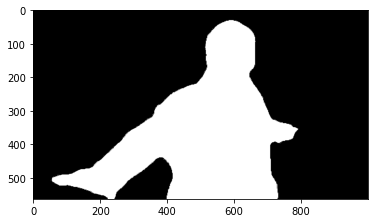

In [22]:
seg_map = np.all(output==seg_color, axis=-1) 
# output의 픽셀별로 색상이 seg_color와 같다면 1(True), 다르다면 0(False)
# seg_color 색상값 = person 색상값 -> 사람이 있는 위치를 제외하고는 gray로 출력 의미

print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray') # cmap 값을 변경하면 다른 색상으로 확인 가능
plt.show()

### <span style = "color:orange;">np.all()</span> 
numpy.all(a, axis=None, out=None, keepdims=<no value>, *, where=<no value>)

Test whether all array elements along a given axis evaluate to True.    
배열의 모든 데이터가 조건과 맞으면 True, 하나라도 다르면 False     
        
배열의 같은 위치에 있는 요소간의 비교    
배열의 shape이 같아야 함    
비교연산자 ==, >, <로 배열 요소 비교     
  
https://numpy.org/doc/stable/reference/generated/numpy.all.html     
https://nov19.tistory.com/106    

### <span style = "color:orange;">seg_map = np.all(output==seg_color, axis=-1)에서</span> 
axis=-1의 의미는??

### <span style = "color:red;">output과 seg_map의 shape</span> 
output의 shape은 (563, 1000, 3)이었음, 3채널이었음    
np.all()을 하고 난 seg_map의 shape은 (563, 1000)임    

물체가 있는 위치는 1(True), 그 외에는 0(False)인 배열이 됨     
예)     
[     
[ 0 1 1 0 0 0 1 1 0 ],     
[ 1 1 1 1 0 1 1 1 1 ],     
[ 0 1 1 1 1 1 1 1 0 ],     
[ 0 0 1 1 1 1 1 0 0 ],     
[ 0 0 0 1 1 1 0 0 0 ]     
]

## Step 2-8. 원본 이미지와 겹쳐서 확인하기(cv2.addWeighted() 이용)

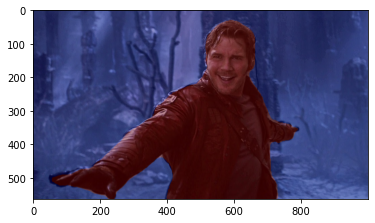

In [26]:
# 주석 출처_노드
# 원본이미지를 img_show에 할당한뒤 이미지 사람이 있는 위치와 배경을 분리해서 표현한 color_mask 를 만든뒤 두 이미지를 합쳐서 출력

img_show = img_orig.copy()

# True과 False인 값을 각각 255과 0으로 바꾸어 줌
img_mask = seg_map.astype(np.uint8) * 255

# 255와 0을 적당한 색상으로 바꾸어 줌
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

# 원본 이미지와 마스트를 적당히 합쳐보기
# 0.6과 0.4는 두 이미지를 섞는 비율
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2-9. 배경 흐리게 만들기(blur() 이용)

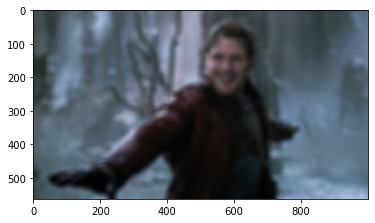

In [27]:
# (20,20)은 blurring kernel size 의미
img_orig_blur = cv2.blur(img_orig, (20,20))

plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2-9. 흐려진 이미지에서 배경만 추출(Segmentation한 mask 이용) 

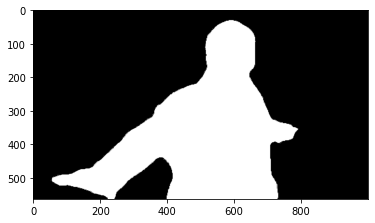

In [28]:
# img_mask 활용
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

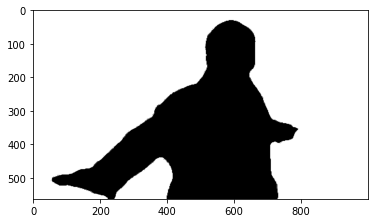

In [29]:
# 반전하기

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

### <span style = "color:orange;">함수 공부!</span>

<span style = "color:red;">plt.imshow()</span>                
저장된 데이터를 이미지의 형식으로 표시     

<span style = "color:red;">cv2.cvtColor(입력 이미지, 색상 변환 코드)</span>      
입력 이미지의 색상 채널을 변경     

<span style = "color:red;">cv2.COLOR_BGR2RGB</span>      
BGR 형식을 RGB 형식으로 변경(원본은 BGR 순서로 픽셀을 읽으므로 이미지 색상 채널 변경 필요)  

<span style = "color:red;">cv2.bitwise_not()</span>     
이미지가 반전된다. 배경이 0 사람이 255였으나     
연산을 하고 나면 배경은 255 사람은 0     

<span style = "color:red;">cv2.bitwise_and()</span>       
0과 어떤 수를 bitwise_and 연산을 해도 0이 되기 때문에 배경만 있는 영상을 얻을 수 있다.    
사람이 0인 경우에는 사람이 있던 모든 픽셀이 0이 된다. 사람이 사라지고 배경만 남는다.     
https://velog.io/@dldndyd01/OpenCV-bitwiseand-or-xor-not-%EA%B8%B0%EB%8A%A5-%EC%A0%95%EB%A6%AC-RGB-Image

[출처_노드]

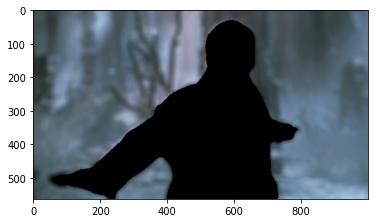

In [30]:
# 배경만 남기기
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2-10. 배경 영상과 사람 영상을 합치기

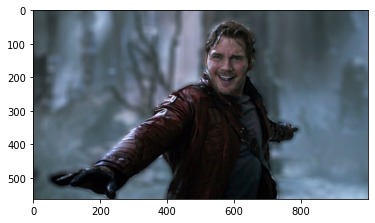

In [31]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)
# 세그멘테이션 마스크가 255인 부분만 원본 이미지 값을 가지고 오고 
# 아닌 영역은 블러된 이미지 값을 사용

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:orange;">np.where(조건, 참일 때, 거짓일 때)</span>     
numpy.where(condition, [x, y, ]/)

Return elements chosen from x or y depending on condition.    
조건을 만족하는 인덱스 반환

예)       
a = np.arange(10)       
a     
-> array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])     

np.where(a < 5, a, 10*a)    
-> array([ 0,  1,  2,  3,  4, 50, 60, 70, 80, 90])

## Step 2-11. 2번째 사진

(899, 1600, 3)


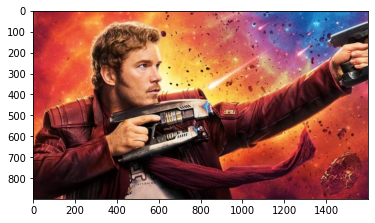

In [35]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/02.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [36]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 
urllib.request.urlretrieve(model_url, model_file) 

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f74b00be730>)

In [37]:
model = semantic_segmentation() 
model.load_pascalvoc_model(model_file) 

In [38]:
segvalues, output = model.segmentAsPascalvoc(img_path)

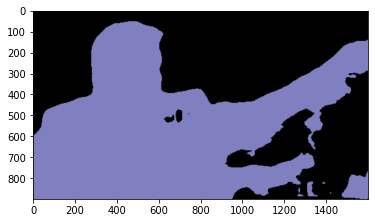

In [39]:
plt.imshow(output)
plt.show()

In [40]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
bottle
person


In [42]:
seg_color = (128,128,192) 

(899, 1600)


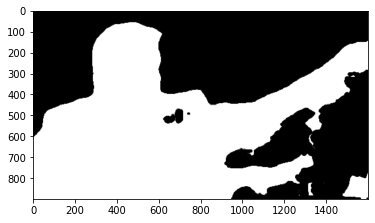

In [43]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

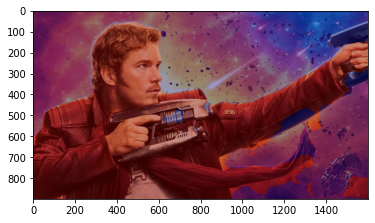

In [44]:
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

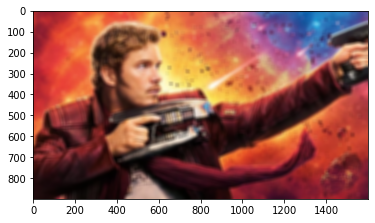

In [45]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

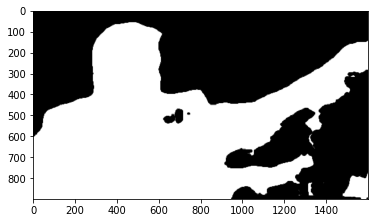

In [48]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

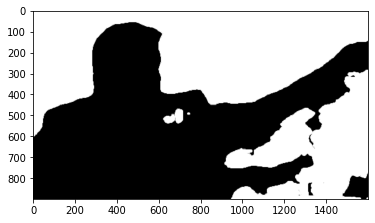

In [49]:
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

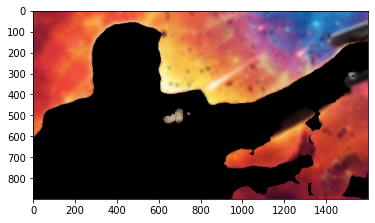

In [50]:
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

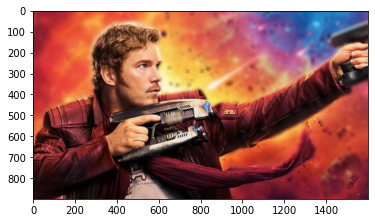

In [51]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## Step 2-12. 3번째 사진

(720, 1280, 3)


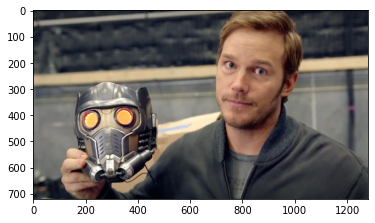

In [52]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/03.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [53]:
model_dir = os.getenv('HOME')+'/aiffel/human_segmentation/models' 
model_file = os.path.join(model_dir, 'deeplabv3_xception_tf_dim_ordering_tf_kernels.h5') 
model_url = 'https://github.com/ayoolaolafenwa/PixelLib/releases/download/1.1/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5' 

urllib.request.urlretrieve(model_url, model_file) 

('/aiffel/aiffel/human_segmentation/models/deeplabv3_xception_tf_dim_ordering_tf_kernels.h5',
 <http.client.HTTPMessage at 0x7f74b04e97f0>)

In [54]:
model = semantic_segmentation() 
model.load_pascalvoc_model(model_file) 

In [55]:
segvalues, output = model.segmentAsPascalvoc(img_path)

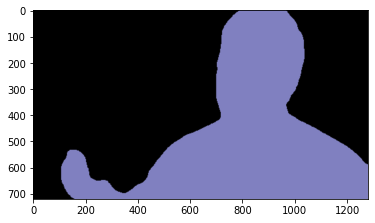

In [57]:
plt.imshow(output)
plt.show()

In [58]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])

background
person


In [60]:
seg_color = (128,128,192) 

(720, 1280)


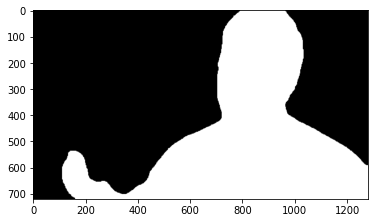

In [61]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

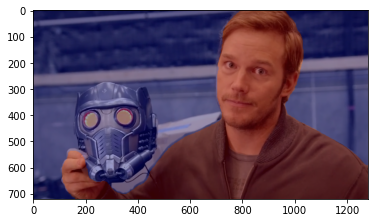

In [62]:
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

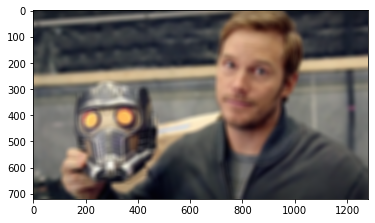

In [63]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

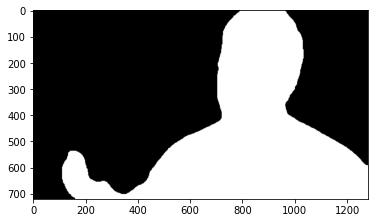

In [64]:
img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

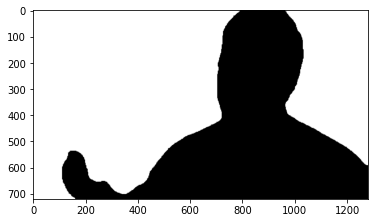

In [65]:
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

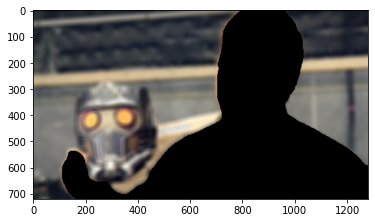

In [66]:
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

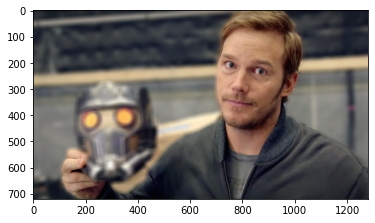

In [67]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

## Step 3. 인물이 주인공이 아닌, 다른 대상에 대한 아웃포커싱 사진 만들기

## Step 3-1. 4번째 사진_마네킹

(1050, 1400, 3)


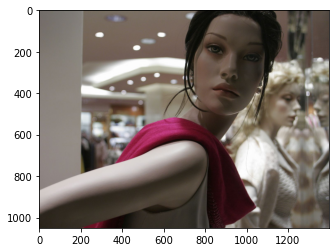

In [68]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/04.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">매 사진마다 모델을 불러왔는데, 불러오지 않고 해봐도 되지 않을까? 한 번 해 보자</span>

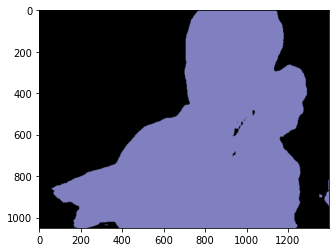

In [69]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

In [70]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] 
seg_color = (128,128,192) 

background
person


(1050, 1400)


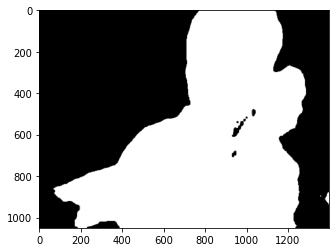

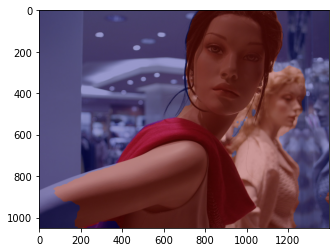

In [71]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

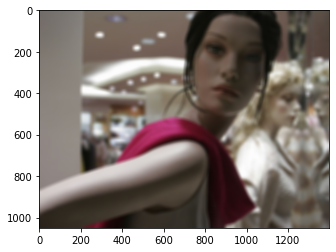

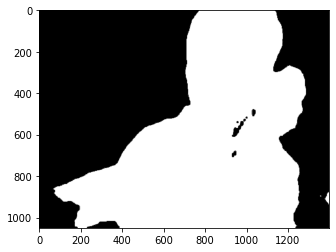

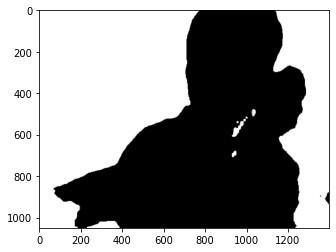

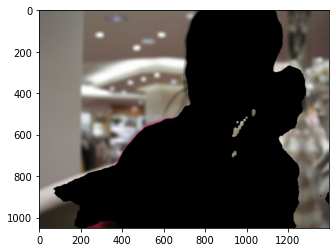

In [72]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

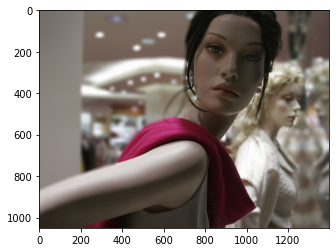

In [73]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">마네킹도 사람으로 인식, 마네킹 두 개를 모두 사람으로 인식</span>

## Step 3-2. 5번째 사진_마네킹 다수, 사람 다수

(462, 694, 3)


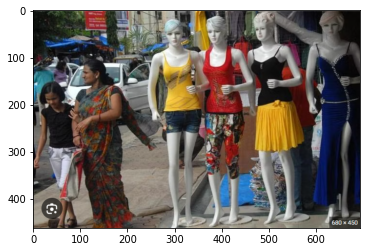

In [74]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/05.PNG'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

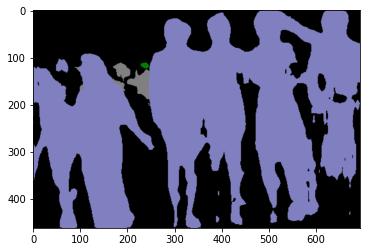

In [75]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

In [76]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3

colormap[:20] #생성한 20개의 컬러맵 출력
seg_color = (128,128,192) 

background
bicycle
car
person


### <span style = "color:red;">bucycle과 car도 인식했음을 알 수 있다.</span>

(462, 694)


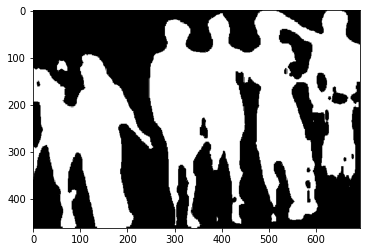

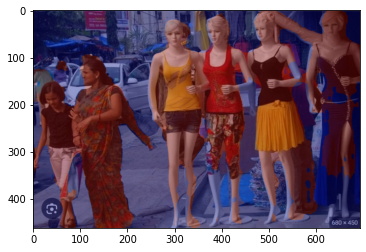

In [77]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

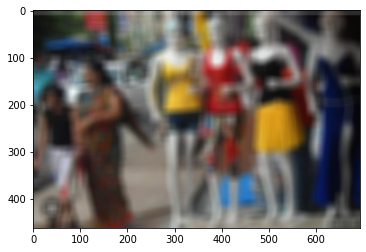

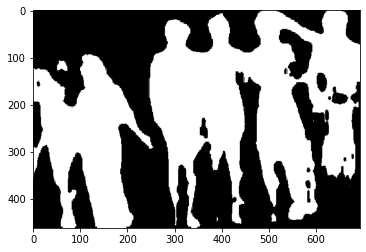

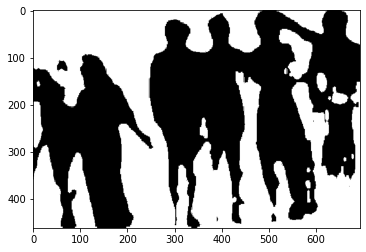

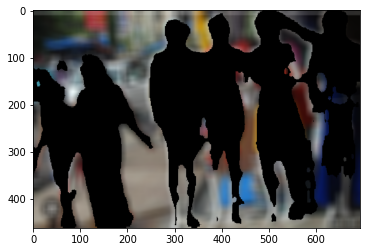

In [78]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

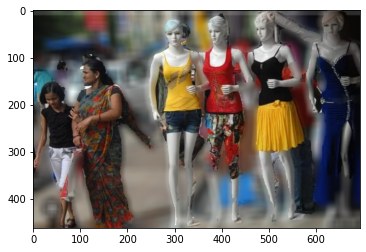

In [79]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">역시 마네킹을 사람으로 분류했으며, 마네킹의 다리와 일부 옷이 제대로 인식되지 않았다.</span>

## Step 3-3. 6번째 사진_마네킹 하나, 사람 한 명

(998, 1500, 3)


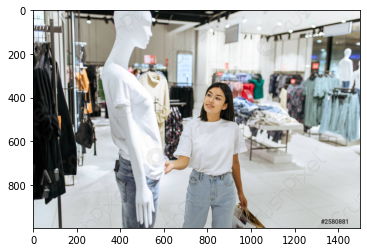

In [80]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/06.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

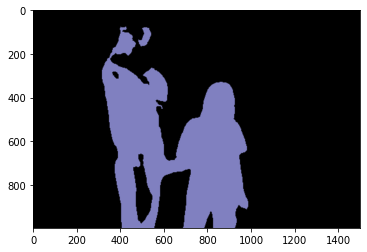

In [81]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

(998, 1500)


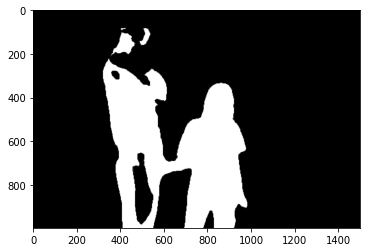

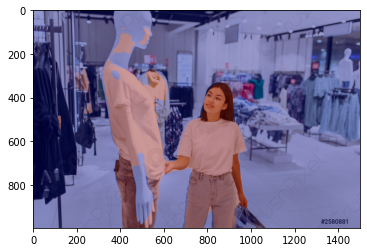

In [82]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

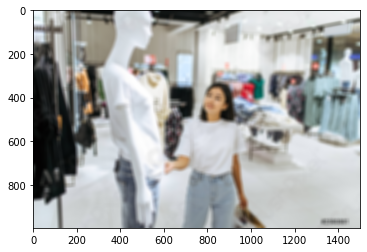

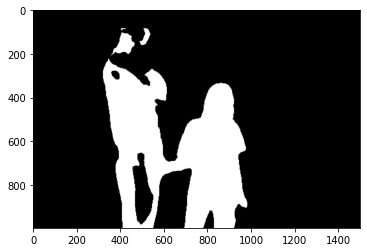

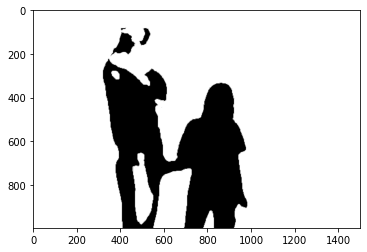

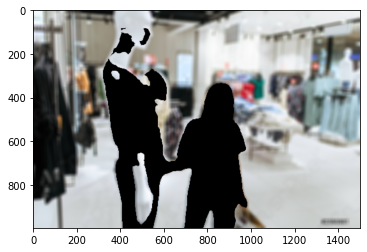

In [83]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

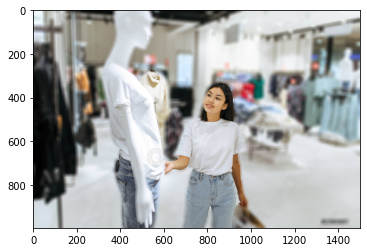

In [84]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">역시 마네킹을 사람으로 분류, 마네킹의 얼굴만 일부 인식, 뒤에 걸려있는 옷도 같이 인식함</span>

## Step 3-4. 7번째 사진_동물(소) 그림 반 사진 반

In [85]:
#pascalvoc 데이터의 라벨 종류
LABEL_NAMES = [
    'background', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
    'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
    'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tv'
]
len(LABEL_NAMES)

21

(720, 1280, 3)


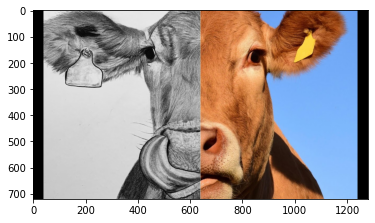

In [86]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/07.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

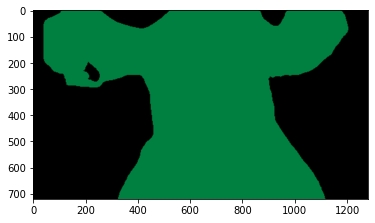

In [87]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

In [89]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3
    
colormap[10] 
seg_color = (0,128,64) 

background
cow


### <span style = "color:red;">background와 cow를 구분한 것을 알 수 있다. 또 소는 사람과 달리 colormap의 값이 다르므로 바꾸어 줌</span>

(720, 1280)


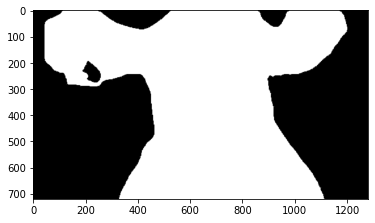

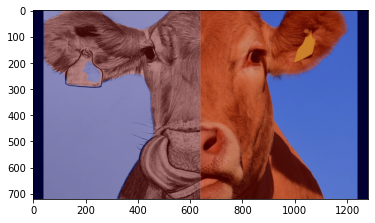

In [90]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

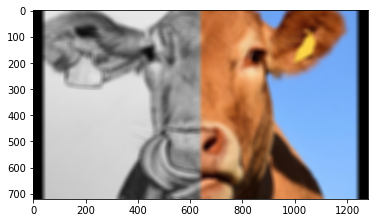

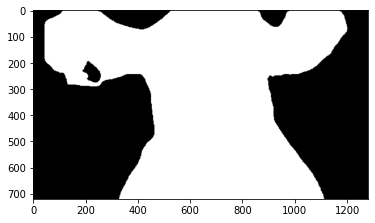

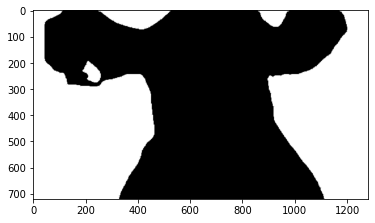

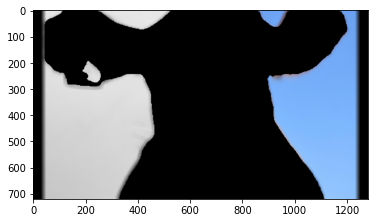

In [91]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

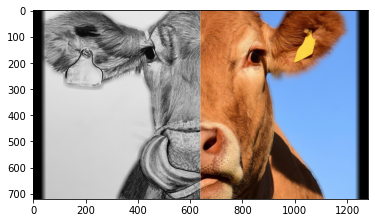

In [108]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">소를 잘 분리하였는데, 그림으로 그린 소도 소로 분리한게 신기!</span>

## Step 3-5. 8번째 사진_동물(소) 그림으로 그린 전체 소 하나, 실제 소 전체 사진 하나

(720, 1280, 3)


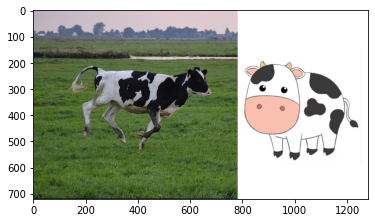

In [92]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/08.jpg'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

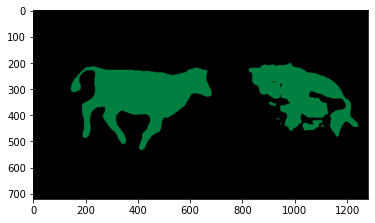

In [93]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

In [95]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3
    
colormap[10] 
seg_color = (0,128,64) 

background
cow


(720, 1280)


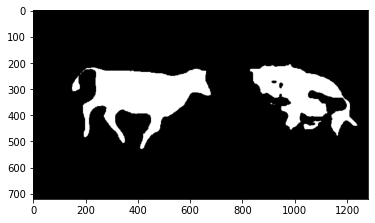

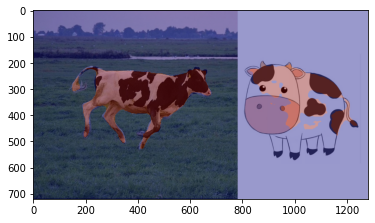

In [96]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

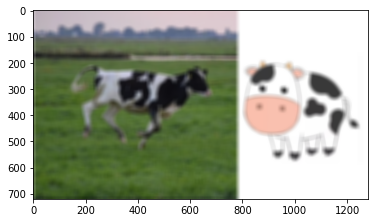

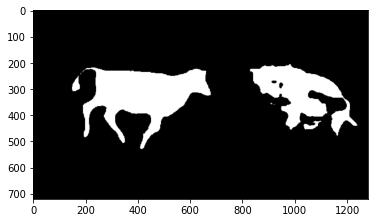

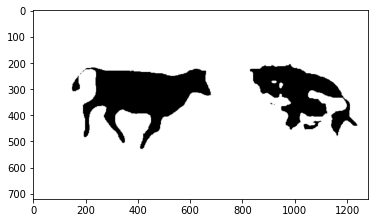

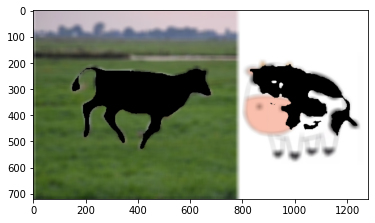

In [97]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

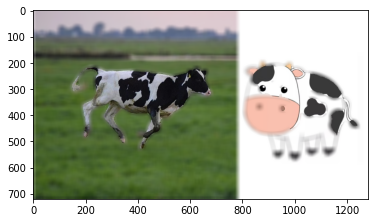

In [98]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">실제 소는 잘 분리하였으나, 그림 소의 경우 무늬있는 곳만 분리한 것처럼 보임</span>

소를 분리할 때, 무늬가 분리하는 데의 주요 특징이 되는 걸까?

## Step 3-6. 9번째 사진_동물(소) 다른 소 모습_그림으로 그린 전체 소 하나, 실제 소 전체 사진 하나

(2100, 3360, 3)


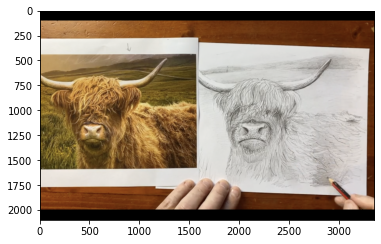

In [99]:
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/09.png'  
img_orig = cv2.imread(img_path) 

print(img_orig.shape)

plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

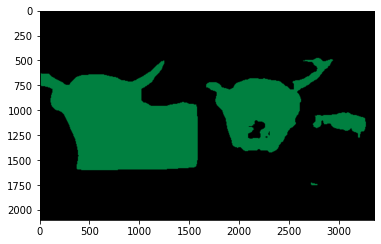

In [100]:
segvalues, output = model.segmentAsPascalvoc(img_path)

plt.imshow(output)
plt.show()

In [101]:
for class_id in segvalues['class_ids']:
    print(LABEL_NAMES[class_id])
    
colormap = np.zeros((256, 3), dtype = int)
ind = np.arange(256, dtype=int)

for shift in reversed(range(8)):
    for channel in range(3):
        colormap[:, channel] |= ((ind >> channel) & 1) << shift
    ind >>= 3
    
colormap[10] 
seg_color = (0,128,64) 

background
cow


(2100, 3360)


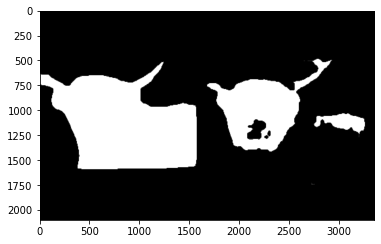

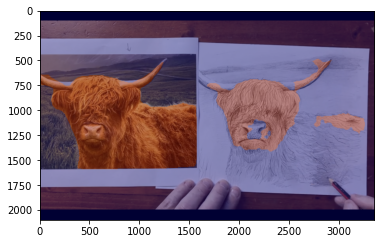

In [102]:
seg_map = np.all(output==seg_color, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

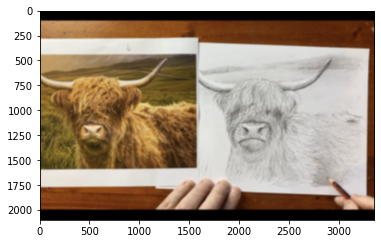

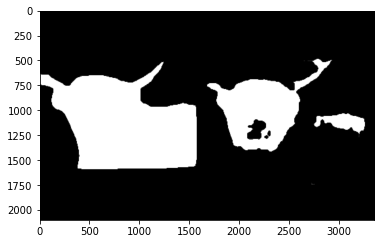

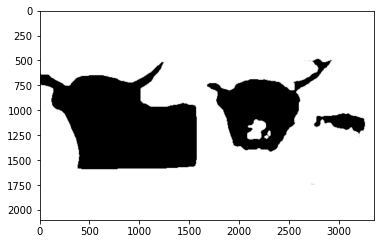

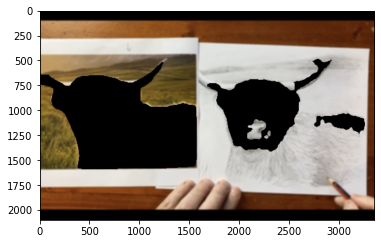

In [103]:
img_orig_blur = cv2.blur(img_orig, (20,20))
  
plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

img_mask_color = cv2.cvtColor(img_mask, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

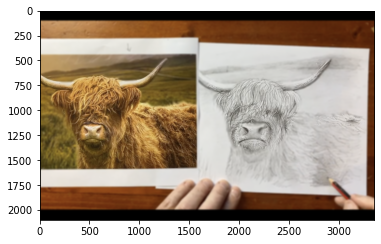

In [104]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">이 사진의 경우에도 실제 소는 잘 분리하였으나, 그림 소의 경우 무늬있는 곳만 분리한 것처럼 보임</span>

아무래도 그림 소는 위 이미지의 경우 연필로 그린 부분이 흐려 구분을 잘 못한 것일 수도 있다.       
또는 이 모델이 소의 실제 사진으로 학습을 더 많이 했기 때문에 그림으로 그린 소를 분리하는데에 익숙하지 않을 수도 있다는 추측을 해본다.

## Step 4. 배경사진을 다른 이미지 합성_10번째 사진_동물 소 + 다른 배경 합치기

## Step 4-1. 소만 이미지에서 분류

(638, 960, 3)


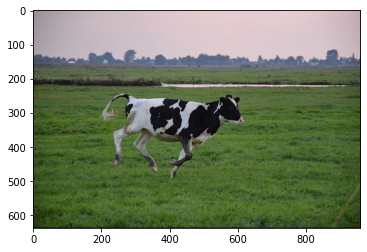

In [119]:
img_path_cow = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/image5.png'  
img_orig_cow = cv2.imread(img_path_cow) 

print(img_orig_cow.shape)

plt.imshow(cv2.cvtColor(img_orig_cow, cv2.COLOR_BGR2RGB))
plt.show()

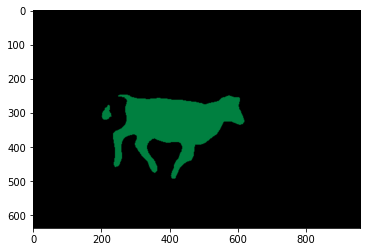

In [120]:
segvalues, output = model.segmentAsPascalvoc(img_path_cow)

plt.imshow(output)
plt.show()

(638, 960)


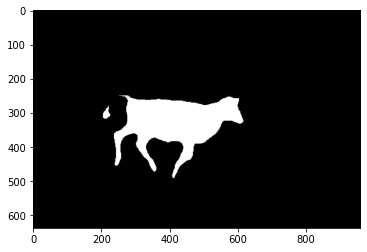

In [121]:
seg_color_cow = (0,128,64) 

seg_map = np.all(output==seg_color_cow, axis=-1) 
print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray')
plt.show()

### <span style = "color:red;"> seg_map이 마스크 검정색 부분은 0, 흰색은 255</span>

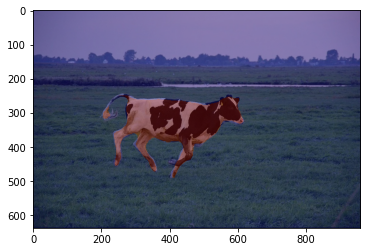

In [122]:
# 원본이미지와 소를 segmentation한 이미지를 합치고, 색을 적절히 조절해 잘 분리되었는지 확인

img_show = img_orig_cow.copy()
img_mask = seg_map.astype(np.uint8) * 255
color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)
img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)
plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

<function matplotlib.pyplot.show(close=None, block=None)>

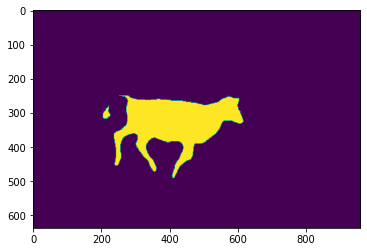

In [123]:
# img_mask = seg_map.astype(np.uint8) * 255 하고 나서 img_mask만 출력해보면
plt.imshow(img_mask)
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

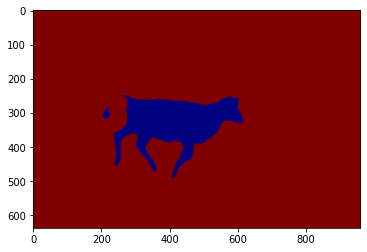

In [124]:
# color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET) 하고 나서 color_mask를 출력해보면
plt.imshow(color_mask)
plt.show

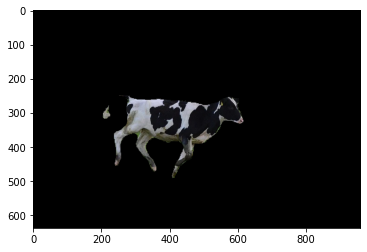

In [126]:
# 반전하지 않고 bitwise_and를 사용함
img_bg_only_cow = cv2.bitwise_and(img_orig_cow, img_mask_color)
plt.imshow(cv2.cvtColor(img_bg_only_cow, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">오..... 대박! 소만 나왔다!!!!!!</span>
### <span style = "color:red;">cv2.bitwise_not으로 반전하지 않고 cv2.bitwise_and만 사용함</span>

## Step 4-2. 양탄자 이미지 불러오고 소와 합치기

(360, 514, 3)


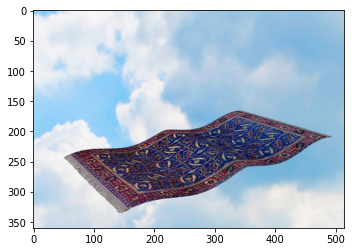

In [127]:
img_path_carpet = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/10.jpg'  
img_orig_carpet = cv2.imread(img_path_carpet) 

print(img_orig_carpet.shape)

plt.imshow(cv2.cvtColor(img_orig_carpet, cv2.COLOR_BGR2RGB))
plt.show()

In [17]:
img_concat = np.where(img_mask_color==255, img_orig_carpet, img_bg_only_cow)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

ValueError: operands could not be broadcast together with shapes (638,960,3) (360,514,3) (638,960,3) 

### <span style = "color:red;">문제점 발생, 소와 양탄자 이미지의 shape이 맞지 않는다.</span>

## Step 4-3. 양탄자 이미지에 패딩을 해 이미지 shape 맞추기(np.pad() 사용)

In [128]:
img_orig_carpet.shape

(360, 514, 3)

In [129]:
img_bg_only_cow.shape

(638, 960, 3)

In [17]:
desired_shape = (638,960,3)

In [18]:
pad_height = desired_shape[0] - img_orig_carpet.shape[0]
pad_width = desired_shape[1] - img_orig_carpet.shape[1]

In [19]:
padded_image_carpet = np.pad(img_orig_carpet, ((0, pad_height), (0, pad_width), (0,0)), mode='constant')

In [20]:
padded_image_carpet.shape

(638, 960, 3)

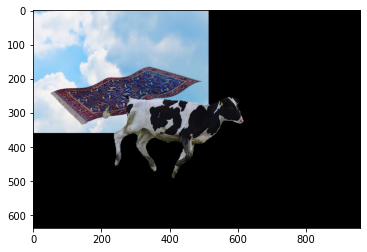

In [21]:
img_concat = np.where(img_mask_color==0, padded_image_carpet, img_bg_only_cow)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">생각했던 것과 다른 결과에 당황, 이미지에 패딩을 해도 shape만 커지고, 이미지 자체가 커지는 것 같지는 않다.</span>

## Step 4-4. 양탄자 이미지를 resize(PIL image.resize() 사용)

In [130]:
from PIL import Image

# img_path_carpet = '/aiffel/project/first-repository/[GD_4_Portrait] images/10.jpg'
img_path_carpet = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/10.jpg'  
image = Image.open(img_path_carpet)

### <span style = "color:orange;">위에서 이미지를 불러 올 때 os.getenv()로만 불러와서 Image.open()으로 어떻게 불러와야 하는지 어려웠다.</span>

여러 시도 끝에 img_path_carpet이라는 변수에 먼저 담고 그것을 Image.open()으로 여는 방법으로 해결할 수 있었다.

In [132]:
resized_image = image.resize((960,638)) # (638,960,3)이었는데 넣을 때 두 개의 숫자를 바꾼다는 부분이 신기

resized_array = np.array(resized_image)

### <span style = "color:orange;">소 이미지의 shape은 (638, 960, 3)인데, image.resize()에서는 638과 960의 순서를 바꾸었다. 왜?</span>

In [133]:
resized_array

array([[[133, 205, 255],
        [133, 205, 255],
        [132, 204, 254],
        ...,
        [172, 205, 224],
        [172, 205, 224],
        [172, 205, 224]],

       [[133, 204, 254],
        [133, 204, 254],
        [132, 204, 253],
        ...,
        [172, 205, 224],
        [172, 205, 224],
        [172, 205, 224]],

       [[133, 203, 252],
        [133, 203, 251],
        [132, 203, 249],
        ...,
        [172, 205, 224],
        [172, 205, 224],
        [172, 205, 224]],

       ...,

       [[231, 232, 236],
        [231, 232, 236],
        [231, 232, 236],
        ...,
        [232, 233, 235],
        [232, 233, 235],
        [232, 233, 235]],

       [[231, 232, 236],
        [231, 232, 236],
        [232, 233, 237],
        ...,
        [231, 232, 236],
        [231, 232, 236],
        [231, 232, 236]],

       [[231, 232, 236],
        [231, 232, 236],
        [232, 233, 237],
        ...,
        [231, 232, 236],
        [231, 232, 236],
        [231, 232, 236]]

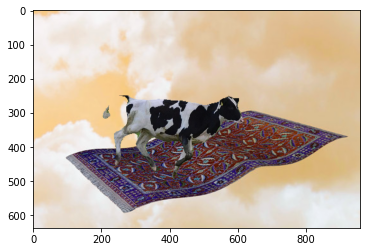

In [134]:
img_concat = np.where(img_mask_color==0, resized_array, img_bg_only_cow)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">예예!!! 그런데 왜 배경 색은 원본과 다르게 나올까? 조정해야 할까? 그렇다면 어떻게?</span>

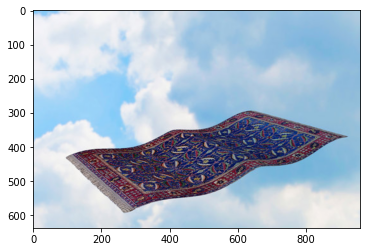

In [135]:
# resize한 이미지 확인
# img_mask_color = cv2.cvtColor(resized_array, cv2.COLOR_GRAY2BGR)

plt.imshow(resized_array)
plt.show()

In [136]:
img_mask_color = cv2.cvtColor(resized_array, cv2.COLOR_GRAY2BGR)

plt.imshow(resized_array)
plt.show()

error: OpenCV(4.5.3) /tmp/pip-req-build-agffqapq/opencv/modules/imgproc/src/color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function 'cv::impl::{anonymous}::CvtHelper<VScn, VDcn, VDepth, sizePolicy>::CvtHelper(cv::InputArray, cv::OutputArray, int) [with VScn = cv::impl::{anonymous}::Set<1>; VDcn = cv::impl::{anonymous}::Set<3, 4>; VDepth = cv::impl::{anonymous}::Set<0, 2, 5>; cv::impl::{anonymous}::SizePolicy sizePolicy = cv::impl::<unnamed>::NONE; cv::InputArray = const cv::_InputArray&; cv::OutputArray = const cv::_OutputArray&]'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 3


### <span style = "color:red;"> resized_array 이미지는 출력해보니 잘 나오는데..</span>

cv2.cvtColor(resized_array, cv2.COLOR_GRAY2BGR)는 에러가 난다. 왜일까?

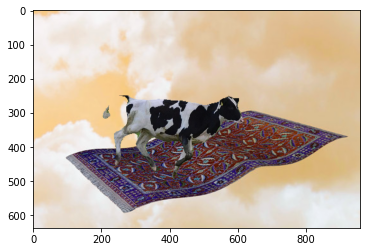

In [137]:
# 다시 확인
img_concat = np.where(img_mask_color==0, resized_array, img_bg_only_cow)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;"> 이미지를 출력할 때 cv2.cvtColor를 하지 않고 출력해보면?</span>

resized_array를 출력했을 때 BGR로 나오지 않고, RGB로 출력했을 때와 동일하게 원본 색으로 잘 출력되므로

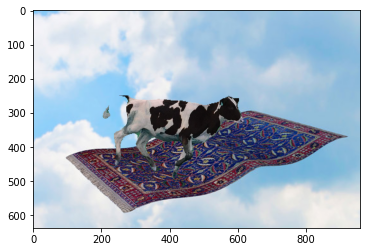

In [139]:
plt.imshow(img_concat)
plt.show()

# 2. 만든 인물 모드 사진의 문제점 찾기

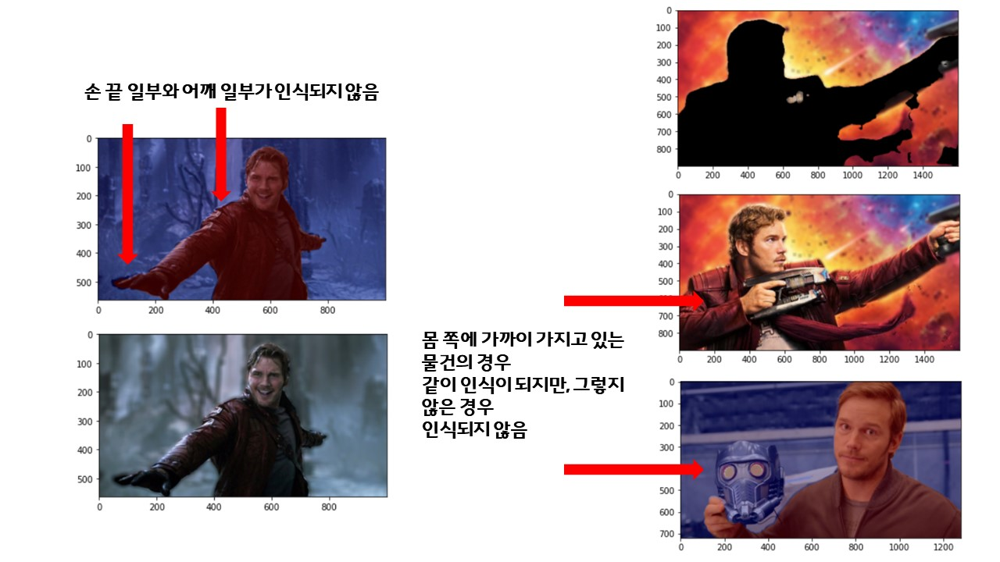

In [142]:
Image("[GD_4_Portrait] images/011.jpg")

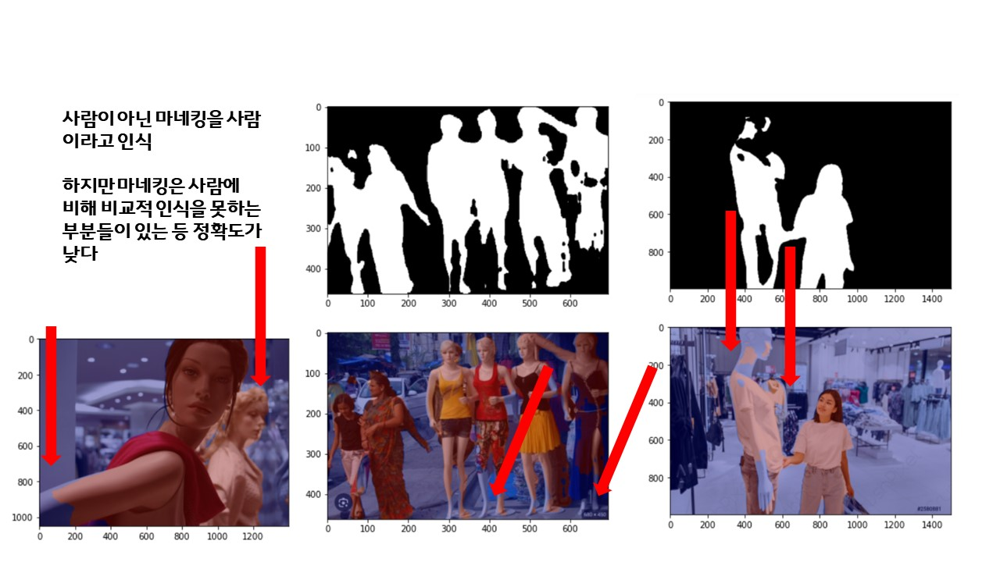

In [143]:
Image("[GD_4_Portrait] images/021.jpg")

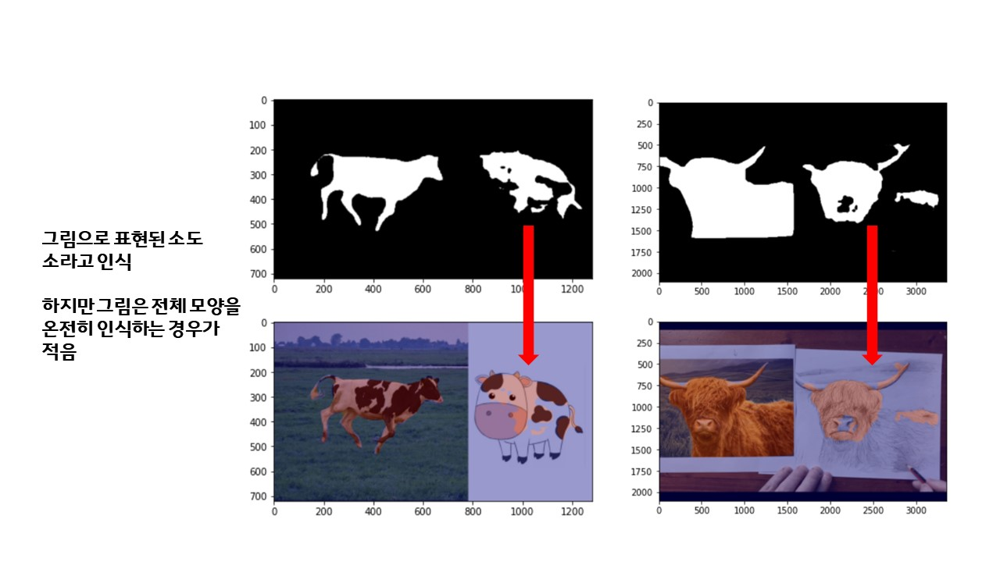

In [144]:
Image("[GD_4_Portrait] images/031.jpg")

### <span style = "color:red;">문제들을 요약해 보면</span>

1. 사람의 손 끝, 어깨 일부 등을 인식하지 못하는 경우가 있음     
2. 몸에 가까이 가지고 있어 몸과 겹쳐 보이는 물건은 사람으로 같이 인식하지만, 손에 들고 있지만 몸과 겹치지 않는 물건은 사람으로 인식하지 않는다.     
3. 마네킹과 그림으로 그린 소 등을 person, cow로 분류함

# 3. 개선 방안 고민 및 도출

### <span style = "color:orange;">문제들을 어떻게 개선할 수 있을까?</span>

1. 사람의 손 끝, 어깨 일부 등을 인식하지 못하는 경우가 있음 **-> 다른 모델을 사용해 보기, 이유 찾아보기**    
2. 몸에 가까이 가지고 있어 몸과 겹쳐 보이는 물건은 사람으로 같이 인식하지만,        
손에 들고 있지만 몸과 겹치지 않는 물건은 사람으로 인식하지 않는다.    **-> 이유 찾아보기** 
3. 마네킹과 그림으로 그린 소 등을 person, cow로 분류함 **-> 인스턴스 세그멘테이션 하기**

## Step 3-1. Xception을 적용해볼 수 있지 않을까?

In [145]:
from tensorflow.keras.applications import Xception

# Load the pre-trained Xception model
xception_model = Xception(weights='imagenet')

91897856/91884032 [==============================] - 1s 0us/step


### <span style = "color:red;">그러나</span>
### 1. ChatGPT의 도움을 받아 모델을 불러오는 것 까지는 했는데, 문제 봉착
이 모델을 사용했을 때 기존 이미지들을 모델에 학습시켰을 때처럼      
segvalues, output = model.segmentAsPascalvoc(img_path)이렇게 코드를 작성하여 값을 보고 싶은데,     
어떻게 도출해내야 하는지에 대한 어려움


### 2. 더불어 자료를 읽던 중 이미 DeepLabV3+는 Encorder에서 Xception을 사용한다는 것을 발견할 수 있었다. 
-> 굳이 Xception을 적용하지 않아도 되지 않을까...?


### 3. Xception은 이미지 분할(segmentation)보다 이미지 분류에 적합하게 개발되어, 
### DeepLabV3 모델을 사용한 것처럼 사용하려면 다른 시도를 해보는게 좋겠다는 글도 찾을 수 있었다.


If you want to use the Xception model for image segmentation similar to how you used the DeepLabV3 model,     
you'll need to employ a different approach.     
Xception alone is not designed for direct image segmentation but rather for image classification. (출처_ChatGPT)

## Step 3-2. DeepLabV3 model이 특정부분을 잘 인식하지 못할 때의 이유에 대해 알아봄

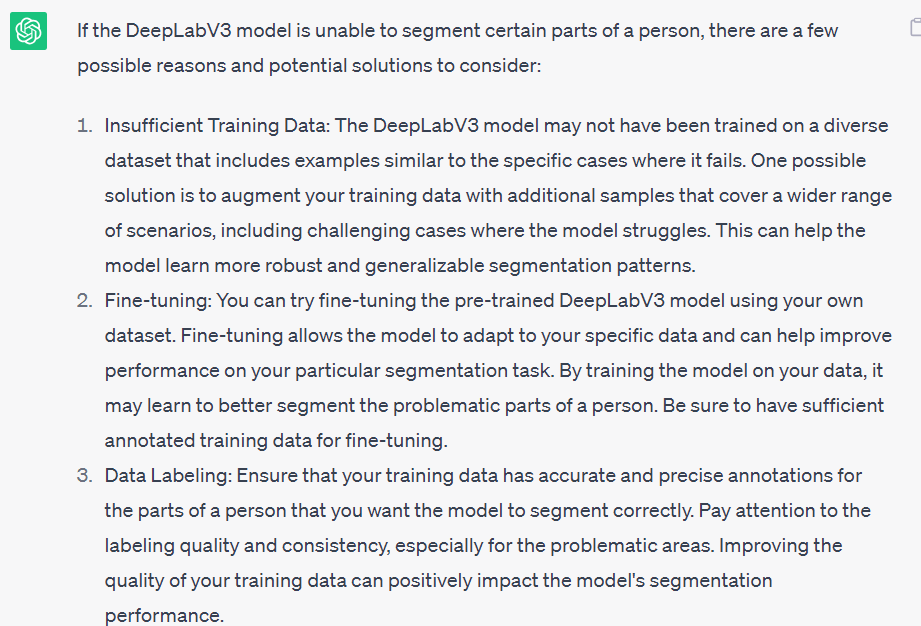

In [147]:
Image("[GD_4_Portrait] images/12.PNG")

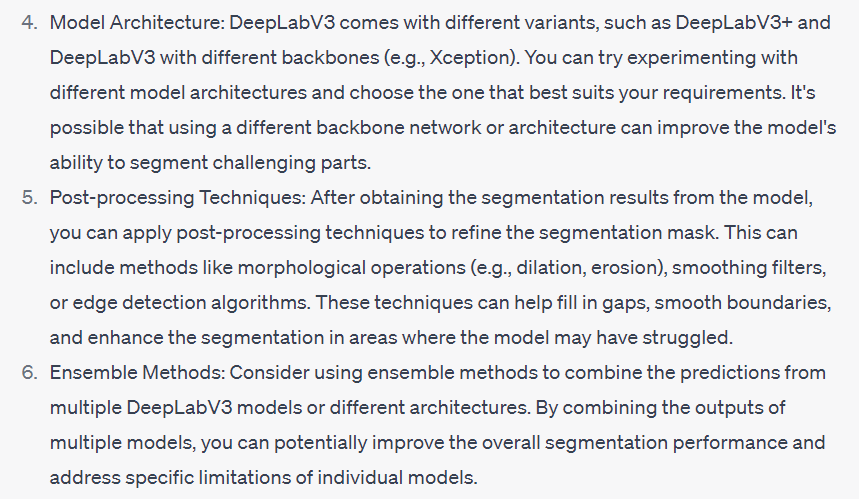

In [148]:
Image("[GD_4_Portrait] images/13.PNG")

### <span style = "color:red;">이유들은 대략적으로</span>

**1. 충분하지 않은 훈련 데이터가 문제일 수 있다.**     

**2. Fine-tuning**      
: 가지고 있는 데이터셋을 가지고 pre-trained된 DeepLabV3 모델에 fine-tuning을 해보라     

**3. 데이터 라벨링**      
: 데이터에 대한 라벨링이 잘 되어있는지 확인할 필요가 있다.    

**4. 모델 아키텍처(구조)**     
: DeepLabV3 모델은 다양한 변형 모델들이 있는데,         
예를 들면 DeepLapV3+, Xception 모델?을 backbone(중심..?)으로 두는 DeepLapV3 모델등이다. 이러한 변형 모델들을 사용해보라      

**5. 데이터 후처리**      
: segmentation 된 이미지를 가지고 보다 정교한 후처리를 하는 방법도 있다. dilation, erosion과 같은 형태학상의 방법,     
smoothing folters(필터를 부드럽게 하는 것?), 또는 모서리 탐지 알고리즘 등    

**6. 앙상블 방법**    
: 다른 모델들에서 나오는 값들과도 합치는 앙상블 방법도 고려해보라는 이야기

## Step 3. 데이터 후처리에서 dilation, erosion에 주목, 팽창/침식 연산을 적용해 볼 수 있지 않을까?

### <span style = "color:red;">팽창 연산(dilation)과 침식 연산(erosion)이란?</span>

**팽창 연산(dilation)**
팽창은 물체의 주변을 확장시키는 연산이다.    
각 픽셀에 적용된 마스크의 유효 영역에 있는 픽셀들을 모두 밝게 만드는 연산으로 객체를 확대한 후 작은 구멍을 채우는 방법이다. 

아래 그림의 경우 gray scale의 이미지에서 3x3 mask를 적용한 것이다.    
마스크의 유효 영역에서 가장 밝은 픽셀의 값을 해당 픽셀의 값으로 대체하여 이미지는 전체적으로 밝아지고    
경계가 부드러워지고, 구멍이 메꿔지는 효과를 가진다고 한다.

https://blog.naver.com/jpjs1888/222526335501

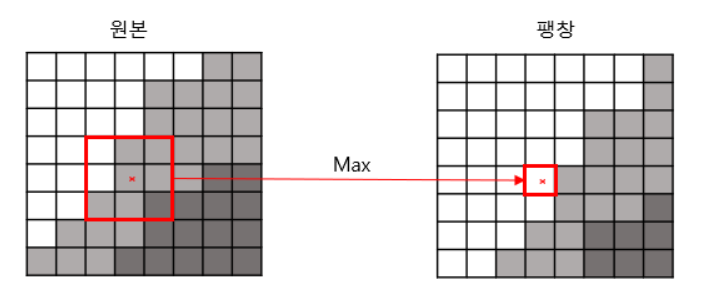

In [356]:
Image("[GD_4_Portrait] images/23.PNG")

**침식 연산(dilation)**    
침식 연산은 팽창과 달리 주변을 축소시키는 연산이다.    
각 픽셀에 적용된 마스크의 유효 영역에 있는 픽셀들 중 가장 어두운 픽셀 값을 취하는 연산으로 객체를 축소시킨다.   

아래의 이미지는 마스크의 유효 영역에서 가장 어두운 픽셀의 값을 해당 픽셀의 값으로 대체하여     
이미지는 전체적으로 어두워지고 경계가 뚜렷해진다.    
뭉쳐있는 객체를 분리시키는 효과를 가진다고 한다.    

https://blog.naver.com/jpjs1888/222526335501

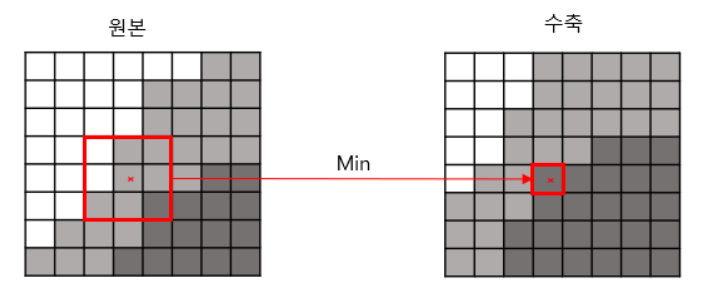

In [357]:
Image("[GD_4_Portrait] images/24.PNG")

## Step 3-1. 원본 이미지에서 침식 연산 적용

(563, 1000, 3)


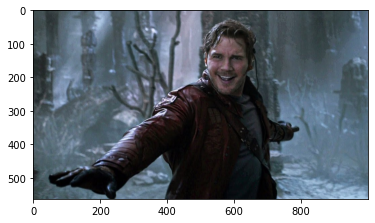

In [149]:
import numpy as np

# 원본이미지 불러오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [152]:
# 1번째 사진을 Image.open()으로 불러오기 
from PIL import Image

img_path_1_erosion = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
image_path_1_erosion = Image.open(img_path_1_erosion)

In [153]:
image_path_1_erosion = np.array(image_path_1_erosion.convert('L'))
print(image_path_1_erosion.shape)
(N,M) = image_path_1_erosion.shape

(563, 1000)


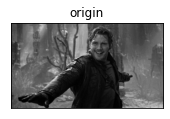

In [154]:
plt.subplot(1,2,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_1_erosion, cmap = 'gray')

In [155]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_1_erosion.copy()
dilate = np.zeros_like(image_path_1_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+3, j:j+3]
        dilate[i][j] = np.min(temp)

### <span style = "color:red;">erosion(침식 연산)과 dilation(팽창 연산)의 차이점은 바로 위 코드</span>

erosion(침식 연산)일 때에는 np.min()     
dilation(팽창 연산)일 때에는 np.max()      

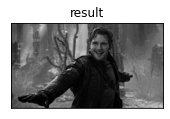

In [156]:
plt.subplot(1,2,2)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:red;">원본이미지로 침식 연산을 했더니 무엇이 다른지 알아볼 수가 없다.</span>
1. 또 이미지 사진이 너무 작게 출력됨
2. segmentation이 된 이미지를 가지고 와서 해봐야 하나?

## Step 3-2. segmentation된 mask와 원본이미지를 합성한 이미지에서 침식 연산 적용

(563, 1000, 3)


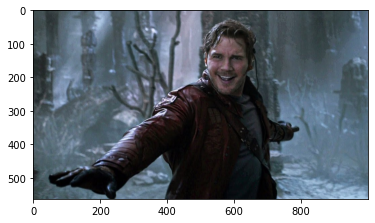

In [215]:
# 원본 이미지 불러오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [216]:
segvalues, output = model.segmentAsPascalvoc(img_path)

In [217]:
seg_color = (128,128,192) 

(563, 1000)


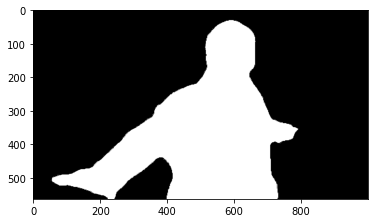

In [218]:
seg_map = np.all(output==seg_color, axis=-1) 

print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray') 
plt.show()

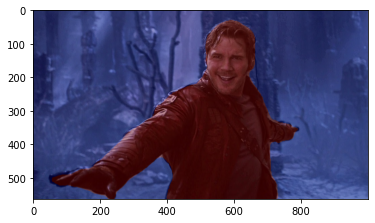

In [219]:
img_show = img_orig.copy()
img_mask = seg_map.astype(np.uint8) * 255

color_mask = cv2.applyColorMap(img_mask, cv2.COLORMAP_JET)

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">여기까지 segmentation된 mask + 원본이미지가 된 이미지를 불러왔다. 침식 연산을 적용해보자</span>

In [162]:
image_path_1_erosion = Image.open(img_show)

AttributeError: 'numpy.ndarray' object has no attribute 'read'

### <span style = "color:red;">시작하자마자 에러라니</span>
침식 연산을 하기 위해서는 Image.open()으로 이미지를 열어야 하는데     
위에서 사용하기로 한 img_show는 바로 열리지 않는다.     
이유는     
**img_show 는 numpy.ndarray로 되어있기에 Image.open()으로 바로 열리지 않는다고 한다.**

### <span style = "color:orange;">ndarray를 이미지 형식으로 바꾸는 등 다른 방법이 있지 않을까?</span>

**Image.fromarray() 를 이용하여 numpy.ndarray를 PIL Image로 바꿀 수 있는 걸 알게됨**

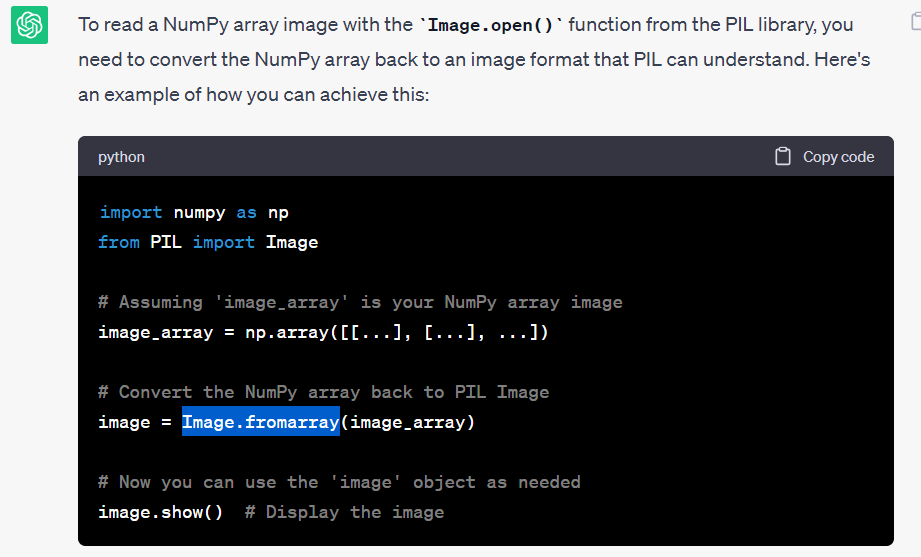

In [171]:
Image("[GD_4_Portrait] images/14.PNG")

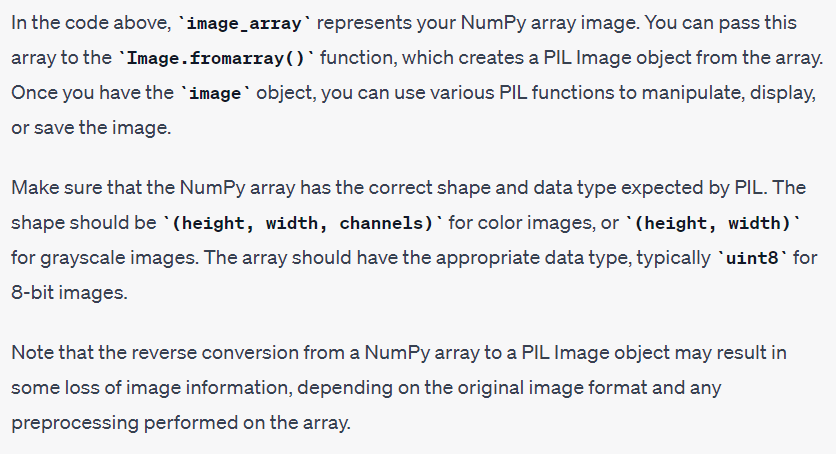

In [172]:
Image("[GD_4_Portrait] images/15.PNG")

### <span style = "color:orange;">다만 확인해야 할 부분은 2가지가 있다.</span>
1. ndarray의 shape이 (height, width, channels)로 되어있고, dtype이 unit8 또는 8-bit image로 되어있는지 확인하기    
2. ndarray를 PIL image로 바꿀 경우 정보의 손실이 있을 수 있는 점 감안하기   

## Step 3-2-1. ndarray를 PIL Image로 format 변환

In [220]:
img_show 
# 흑백으로 되어있는 segemtation해서 나온 output을 시각화 한 mask 
# 출력해보면 ndarray로 되어있고, dtype은 unit8이다. 

array([[[ 99,  47,  39],
        [101,  49,  41],
        [102,  50,  42],
        ...,
        [127,  63,  50],
        [132,  68,  55],
        [138,  74,  62]],

       [[100,  48,  40],
        [100,  49,  40],
        [101,  49,  41],
        ...,
        [130,  67,  54],
        [132,  68,  55],
        [135,  71,  58]],

       [[101,  49,  41],
        [100,  48,  40],
        [ 99,  47,  38],
        ...,
        [133,  70,  57],
        [133,  67,  55],
        [133,  67,  55]],

       ...,

       [[100,  47,  38],
        [100,  47,  39],
        [100,  47,  38],
        ...,
        [189, 119,  99],
        [186, 116,  97],
        [184, 115,  95]],

       [[100,  46,  38],
        [101,  46,  38],
        [100,  47,  38],
        ...,
        [189, 119, 100],
        [184, 115,  95],
        [181, 112,  92]],

       [[ 99,  44,  37],
        [100,  45,  37],
        [100,  47,  38],
        ...,
        [189, 119, 100],
        [183, 113,  93],
        [178, 108,  88]]

In [221]:
img_show.shape # shape은 height, width, channels로 되어있는 것 같다. 3은 확실히 channels...

(563, 1000, 3)

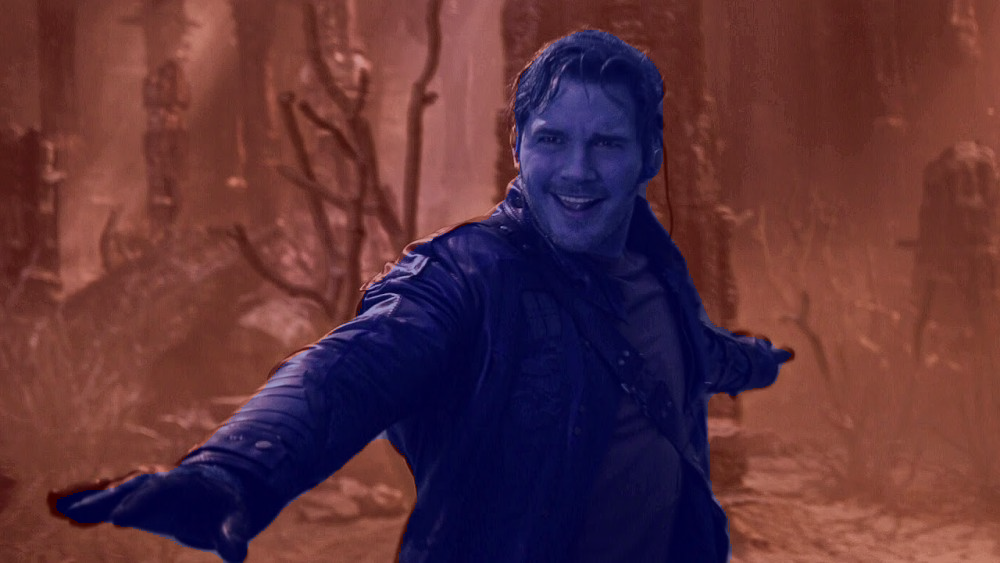

In [225]:
import numpy as np
from PIL import Image

image = Image.fromarray(img_show)
image.show()

### <span style = "color:red;">ndarray를 PIL Image로 변환 성공, 다시 침식 연산을 적용해보면</span>

In [173]:
# 다시 불러오기
image_path_1_erosion = Image.open(image)

AttributeError: type object 'Image' has no attribute 'open'

In [175]:
from PIL import Image # 이 친구를 같이 붙여 출력해보자
image_path_1_erosion = Image.open(image)

AttributeError: read

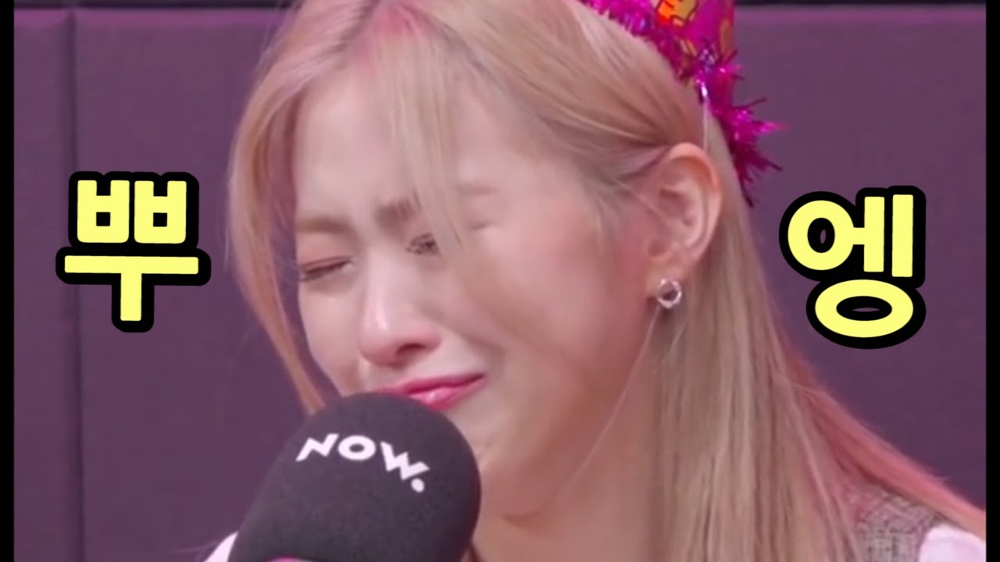

In [340]:
Image("[GD_4_Portrait] images/21.jpg")

### <span style = "color:red;">Image.open()에서 계속 에러가 난다, 아 img라는 변수에 담겨 출력된 이 img가 저장이 되어있지 않아서 그럴까?</span>

그래.. 저장을 다시 해보자     
이미지 이름을 16.jpg라고 하고 저장을 해보자

In [177]:
save_path = '/aiffel/project/first-repository/[GD_4_Portrait] images/16.jpg'
image.save(save_path)

FileNotFoundError: [Errno 2] No such file or directory: '/aiffel/project/first-repository/[GD_4_Portrait] images/16.jpg'

### aiffel 앞에 /를 빼고 다시 시도

In [178]:
save_path = 'aiffel/project/first-repository/[GD_4_Portrait] images/16.jpg'
image.save(save_path)

FileNotFoundError: [Errno 2] No such file or directory: 'aiffel/project/first-repository/[GD_4_Portrait] images/16.jpg'

### <span style = "color:red;">디렉토리가 없다고 에러가 남, 왜 그럴까 원인을 살펴보자</span>

## Step 3-2-2. PIL Image로 format을 변환 후 저장시 no directory 문제

### <span style = "color:orange;">디렉토리가 있는지 없는지 os.path.exists()를 통해 알 수 있다</span>

In [179]:
import os

directory_path = 'aiffel/project/first-repository/[GD_4_Portrait] images/' # 쥬피터에서 보았을 때 만들어져있는 폴더인데..

In [180]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory does not exist


### <span style = "color:red;">디렉토리가 없다고 나온다.. 무슨...</span>

In [181]:
path = os.getcwd() # 현재 경로(현재 폴더 위치) 확인
print(path)

/aiffel/aiffel/project/first-repository


### <span style = "color:orange;">디렉토리에 대해 알아보자</span>

**디렉토리는 폴더에요??? 라는 궁금증이 생김**

**Directory**     
- 폴더     
- 파일 분류를 위해서 붙이는 이름을 가진 공간     

**Directory 계층구조**     
- 나뭇가지처럼 뻗어나가는 트리 구조     

**Directory 경로**     
- directory가 위치한 곳을 나타내는 주소     
- 절대 경로와 상대 경로가 있다.     
- 절대 경로     
: directory가 위치한 곳을 나타내는 가장 디테일하고 정확한 주소     
: 현재 위치해 있는 곳과 상관없이 늘 같은 의미를 가짐     
- 상대 경로     
: directory가 위치한 곳을 현재 위치를 기준으로 설명하는 것    
: 현재 위치해 있는 곳에 따라서 동일한 표현도 다른 의미 가능     
: 본인의 위치 .     
: 부모(한 단계 위)의 위치 ..     

출처_ https://www.youtube.com/watch?v=6z7FVYXnk3E

In [182]:
directory_path = 'aiffel/project/first-repository/[GD_4_Portrait] images/'

In [183]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory does not exist


In [186]:
directory_path = 'aiffel/project/first-repository'

In [187]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory does not exist


In [196]:
directory_path = '/aiffel/project'

In [197]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory does not exist


### <span style = "color:red;">내가 생각한 디렉토리(폴더)들을 조회해보니 파이썬에서는 디렉토리가 없다고 한다</span>

## Step 3-2-3. 디렉토리를 만들어보자, os.makedirs()로 가능

In [ ]:
import os

directory_path = '/path/to/new/directory/subdirectory/'

Create the directory and its parent directories if they don't exist
os.makedirs(directory_path)

In [201]:
directory_path = 'aiffel/project/cheese/'

# Create the directory and its parent directories if they don't exist
os.makedirs(directory_path)

In [202]:
directory_path = 'aiffel/project/cheese/'

In [203]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory exists


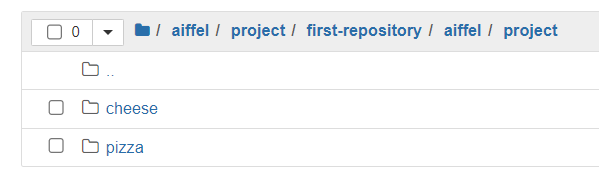

In [211]:
Image("[GD_4_Portrait] images/17_pizza, cheese.PNG")

In [204]:
directory_path = '/aiffel/project/pickle/'

# Create the directory and its parent directories if they don't exist
os.makedirs(directory_path)

In [205]:
directory_path = '/aiffel/project/pickle/'

In [206]:
if os.path.exists(directory_path):
    print("Directory exists")
else:
    print("Directory does not exist")

Directory exists


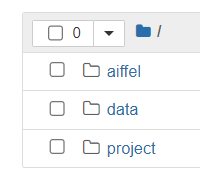

In [210]:
Image("[GD_4_Portrait] images/16_pickle.PNG")

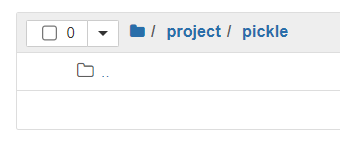

In [209]:
Image("[GD_4_Portrait] images/16.PNG")

### <span style = "color:red;">허허... 알다가도 모르겠네... 왜 이렇게 만들어지는 걸까</span>

**pizza, cheese는 aiffel 앞에 /를 안 해줌**    
directory_path = 'aiffel/project/cheese/'

**pickle은 앞에 /를 해줌**    
directory_path = '/aiffel/project/pickle/'

### <span style = "color:red;">원하는 위치에 디렉토리가 만들어지지는 않았지만</span>

#### 어찌 되었던 디렉토리로 인식하는 곳이 생겼으니 거기에 저장을 해봅시다.
(어후 먼길을 돌고 돌아...)

## Step 3-2-4. 새로 만든 디렉토리에 저장

In [212]:
# cheese 디렉토리에 저장을 해 봅시다
save_path = 'aiffel/project/cheese/'
image.save(save_path)

ValueError: unknown file extension: 

### <span style = "color:red;">아니 또 에러가 난다고???</span>

**ValueError: unknown file extension:  이 에러는 무슨 뜻일까**    
다시 해보자

In [226]:
# cheese 디렉토리에 저장을 해 봅시다
save_path = 'aiffel/project/cheese/'
image.save(save_path)

ValueError: unknown file extension: 

### <span style = "color:orange;">PIL image format으로 변경했는데... 왜 unknow file extension이라고 할까?</span>

The ValueError: unknown file extension error occurs        
when the save() method of the PIL Image object cannot determine the file format from the provided file extension.         

To fix this issue, you need to specify a valid file extension that corresponds to a supported image format.      
  
이 에러는 save()를 사용할 때 PIL Image 객체의 파일 format이 정해져있지 않아 나는 오류같다.      
내가 저장할 때 디렉토리까지만 써주었으므로 **저장할 파일이름**과 **확장자**가 필요한 것    

[출처_ChatGPT]

In [227]:
# cheese 디렉토리에 저장을 해 봅시다
save_path = 'aiffel/project/cheese/001.jpg'
image.save(save_path)

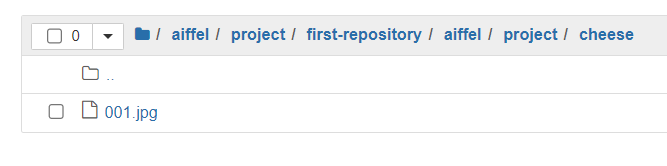

In [230]:
Image("[GD_4_Portrait] images/18.PNG")

### <span style = "color:red;">오예에에에 되었다!!</span>
이제 저장을 했으니 무엇을 해야할까?    
아래의 이미지를 저장했으니 침식 연산을 이어가봅시다.

## Step 3-2-5. 디렉토리에 저장한 PIL Image로 침식 연산 진행

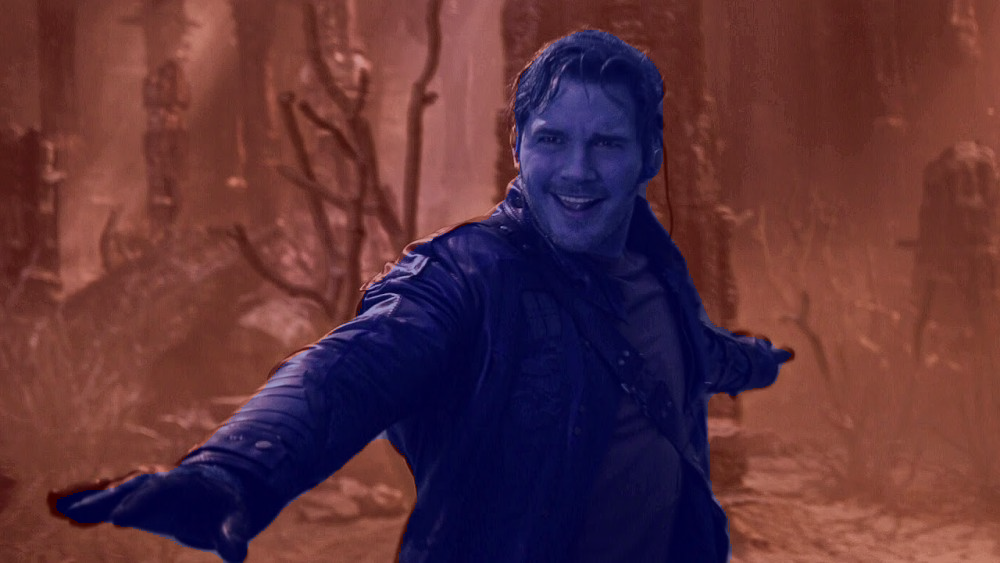

In [248]:
# 이 이미지입니다.
image.show()

In [255]:
from PIL import Image # 이 친구를 붙이니 다시 됨
image_path_1_erosion = Image.open('aiffel/project/cheese/001.jpg')

In [256]:
image_path_1_erosion = np.array(image_path_1_erosion.convert('L'))
print(image_path_1_erosion.shape)
(N,M) = image_path_1_erosion.shape

(563, 1000)


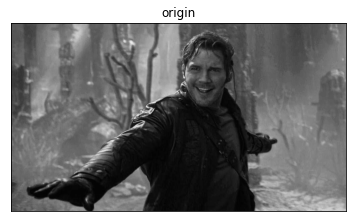

In [257]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_1_erosion, cmap = 'gray')

In [258]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_1_erosion.copy()
dilate = np.zeros_like(image_path_1_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+3, j:j+3]
        dilate[i][j] = np.min(temp)

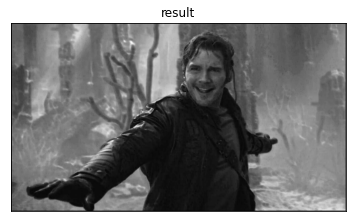

In [262]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:red;">cmap = gray로 나오니 침식연산 전과 후를 비교하기 어렵다. </span>

## Step 3-2-6. cv2.cvtColor을 통해 색을 바꿔서 출력 시도

(563, 1000, 3)


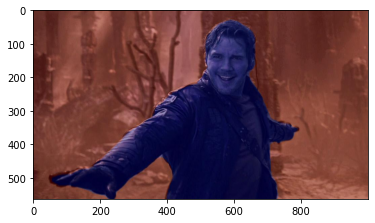

In [267]:
# 원본이미지 다시 불러오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/aiffel/project/cheese/001.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
# plt.imshow(img_orig)
plt.show()

In [268]:
from PIL import Image # 이 친구를 붙이니 다시 됨
image_path_1_erosion = Image.open('aiffel/project/cheese/001.jpg')

In [269]:
image_path_1_erosion = np.array(image_path_1_erosion.convert('L'))
print(image_path_1_erosion.shape)
(N,M) = image_path_1_erosion.shape

(563, 1000)


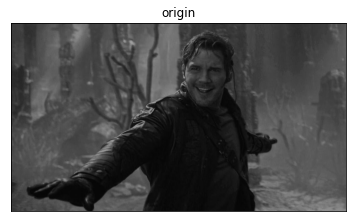

In [274]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)

plt.imshow(cv2.cvtColor(image_path_1_erosion, cv2.COLOR_BGR2RGB))
# plt.imshow(image_path_1_erosion, cmap = 'gray')
# plt.imshow(image_path_1_erosion)

### <span style = "color:red;">cmap = 'gray' 와 같은 결과가 나온다.</span>

## Step 3-2-7. cmap을 적용하지 않고 출력

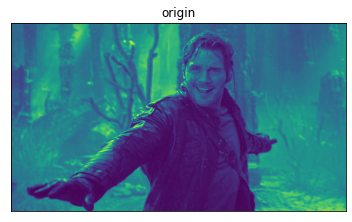

In [275]:
# cmap='gray'를 적용하지 않고 침식연산한 후의 이미지를 출력해보면

plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)

plt.imshow(image_path_1_erosion)

In [276]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_1_erosion.copy()
dilate = np.zeros_like(image_path_1_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+3, j:j+3]
        dilate[i][j] = np.min(temp)

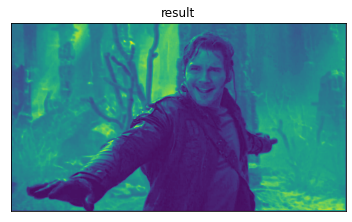

In [277]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate)
plt.show()

### <span style = "color:red;">원본사진과 침식 연산하기 전과 비교하기가 어렵다. 흑백으로 나오는 mask 이미지로 해보면 어떨까?</span>

## Step 3-3. 흑백으로 나오는 segmentation된 mask 이미지로 침식 연산 수행

(563, 1000, 3)


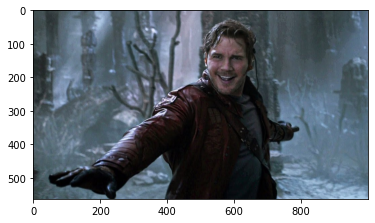

In [278]:
# 원본이미지 다시 가지고 오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

In [279]:
segvalues, output = model.segmentAsPascalvoc(img_path)

In [280]:
seg_color = (128,128,192) 

(563, 1000)


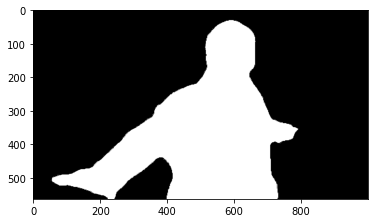

In [281]:
seg_map = np.all(output==seg_color, axis=-1) 

print(seg_map.shape) 
plt.imshow(seg_map, cmap='gray') 
plt.show()

In [282]:
seg_map

array([[False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       ...,
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False],
       [False, False, False, ..., False, False, False]])

In [283]:
img_mask = seg_map.astype(np.uint8) * 255

In [284]:
img_mask

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

### <span style = "color:orange;">ndarray로 된 걸 PIL Image로 바꾸어주자</span>

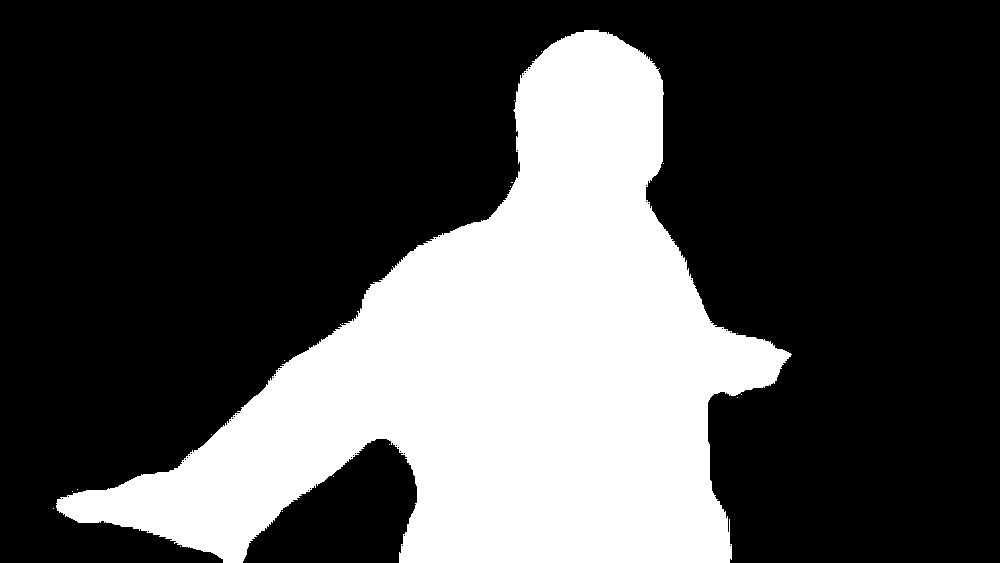

In [285]:
image = Image.fromarray(img_mask)
image.show()

### <span style = "color:orange;">cheese 디렉토리에 저장을 해보는 단계</span>

In [286]:
save_path = 'aiffel/project/cheese/002.jpg'
image.save(save_path)

In [287]:
from PIL import Image 
image_path_2_erosion = Image.open('aiffel/project/cheese/002.jpg')

### <span style = "color:orange;">침식 연산 수행</span>

In [288]:
image_path_2_erosion = np.array(image_path_2_erosion.convert('L'))
print(image_path_2_erosion.shape)
(N,M) = image_path_2_erosion.shape

(563, 1000)


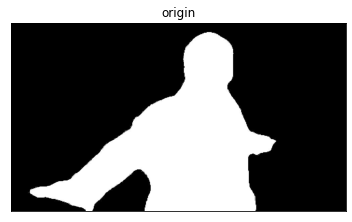

In [289]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_2_erosion, cmap = 'gray')

In [290]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_2_erosion.copy()
dilate = np.zeros_like(image_path_2_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+3, j:j+3]
        dilate[i][j] = np.min(temp)

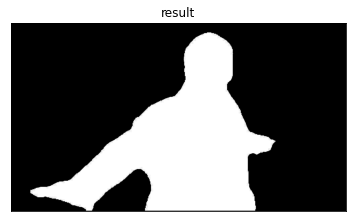

In [291]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:red;">흑백과 같은 명암이 분명한 사진으로 하면 차이가 있을까 싶었는데 차이를 잘 모르겠다.</span>
### <span style = "color:orange;">침식 연산시 주었던 3*3 mask의 크기를 조절해보면?</span>

## Step 3-3-1. segmentation된 mask 이미지 침식 연산의 mask 크기 조절

In [323]:
from PIL import Image 
image_path_8_erosion = Image.open('aiffel/project/cheese/002.jpg')

In [324]:
image_path_8_erosion = np.array(image_path_8_erosion.convert('L'))
print(image_path_8_erosion.shape)
(N,M) = image_path_8_erosion.shape

(563, 1000)


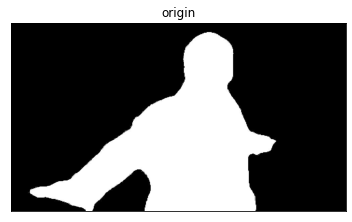

In [325]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_8_erosion, cmap = 'gray')

In [326]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_8_erosion.copy()
dilate = np.zeros_like(image_path_8_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+7, j:j+7] # 7*7 mask 적용
        dilate[i][j] = np.min(temp)

### <span style = "color:orange;">위 코드에서 7*7 mask 적용</span>

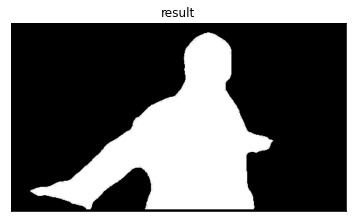

In [327]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:orange;">mask의 크기를 변경해보니</span>
1. 5x5 mask와 3x3 mask는 결과의 차이가 별로 없다.
2. 7x7 mask를 적용한 경우 3x3 mask와 비교시 흰색 부분이 줄어들었음을 위 코드에서 확인할 수 있었다.

### <span style = "color:red;">1x1 mask로 해보면 어때?</span>

In [303]:
from PIL import Image 
image_path_5_erosion = Image.open('aiffel/project/cheese/002.jpg')

In [304]:
image_path_5_erosion = np.array(image_path_5_erosion.convert('L'))
print(image_path_5_erosion.shape)
(N,M) = image_path_5_erosion.shape

(563, 1000)


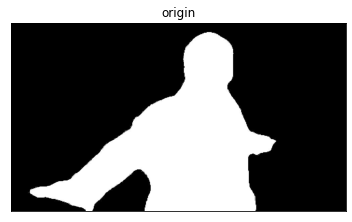

In [305]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_5_erosion, cmap = 'gray')

In [307]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_5_erosion.copy()
dilate = np.zeros_like(image_path_5_erosion)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+1, j:j+1] # 1*1 mask 적용
        dilate[i][j] = np.min(temp)

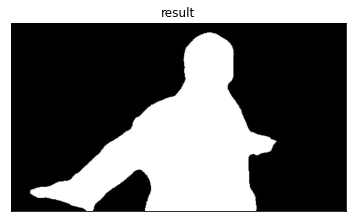

In [308]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:red;">1*1 mask로 하니 좀 더 넓어진 것 같다. 흰색 부분이!</span>

현재 우리가 원하는 것을 다시 정의해보면        
DeepLabV3+ 모델을 통해 segmentation한 후의 image mask가 사람의 옷 일부라던가 손 일부를 인식하지 못하는 문제를 개선하고 싶다.        

사람영역으로 구분하는 img mask의 크기가(흰색 영역의 크기가) 더 커질 수 있게 하면 되지 않을까? 라는 생각    

7x7 mask로 했을 때에는 사람 영역(흰색)이 줄어드는 것을 볼 수 있었고,    
1x1 mask로 했을 때에는 반대로 사람 영역(흰색)이 늘어나는 것을 볼 수 있었으므로    

**1x1 mask를 적용한 침식 연산을 한 img mask의 이미지를 blurred image와 합쳐보자**   

## Step 3-3-2. 1x1 mask를 적용한 침식 연산 img_mask과 segmentation된 색 반전 사진과 합치기

최종 침식연산(1x1 mask 적용)을 하고 난 이미지의 변수 이름은 dilate     
이 이미지는 ndarray일까 아니면 PIL Image일까, 확인     

In [309]:
dilate

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

In [310]:
# 255와 0을 적당한 색상으로 바꾸어 줌
color_mask = cv2.applyColorMap(dilate, cv2.COLORMAP_JET)

(563, 1000, 3)


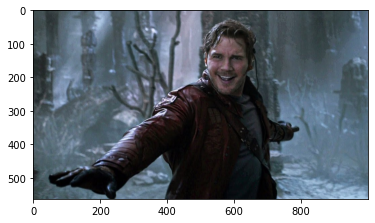

In [311]:
# 원본이미지 다시 가지고 오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

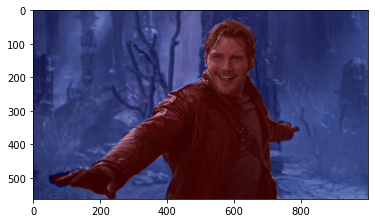

In [312]:
img_show = img_orig.copy()


img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

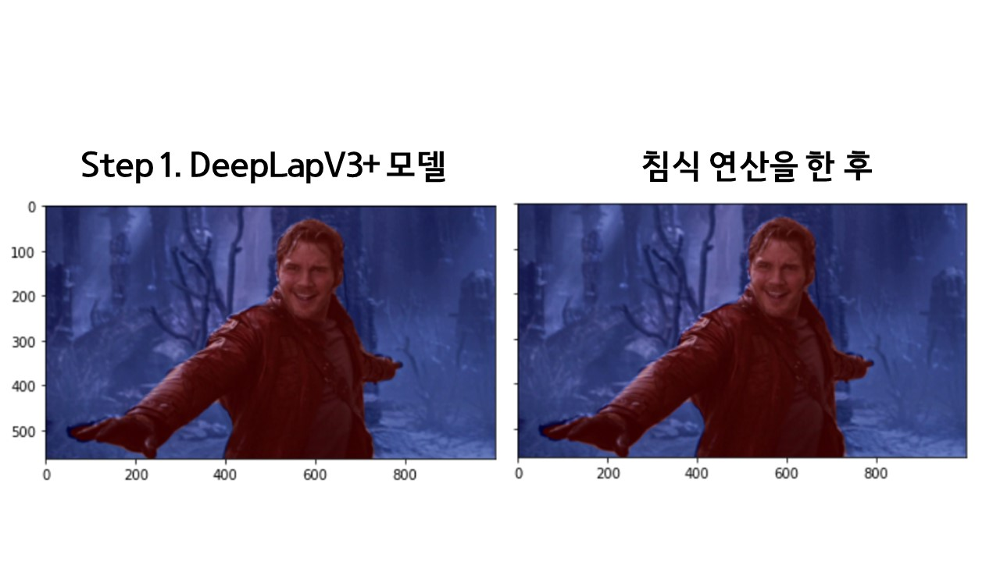

In [316]:
Image("[GD_4_Portrait] images/20.jpg")

### <span style = "color:red;">사진을 확대해서 보았는데 큰 차이가 없다.</span>

## Step 3-3-3. 1x1 mask를 적용한 침식 연산 img_mask과 blurred img와 합치기

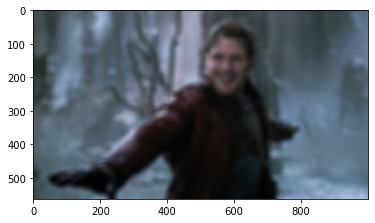

In [317]:
img_orig_blur = cv2.blur(img_orig, (20,20))

plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

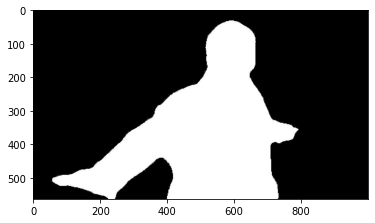

In [318]:
img_mask_color = cv2.cvtColor(dilate, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

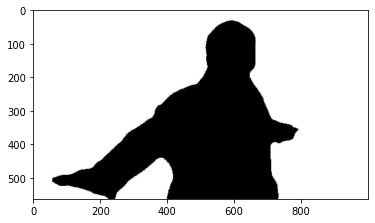

In [319]:
# 반전하기
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

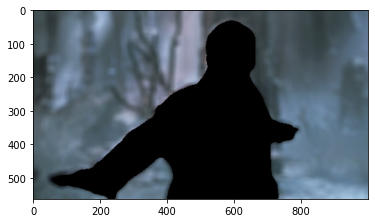

In [320]:
# 배경만 남기기
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

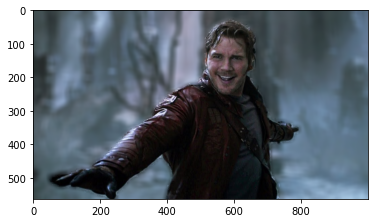

In [321]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">역시 침식 연산을 하기 전과 후가 큰 차이가 없어 보인다.</span>
### <span style = "color:orange;">확실히 흑백의 img_mask에는 침식 연산 전과 후 변화가 있었다.</span>

1x1 mask로 침식 연산 패딩한 것으로 적용해 보았는데     
**반대로 7x7 mask로 침식 연산 패딩한 것을 적용해 보면?**    

참고로 7x7 mask는 흰색 부분(사람 영역)이 다소 줄어드는 것을 알 수 있었다.     

## Step 3-3-4. 7x7 mask를 적용한 침식 연산 img_mask과 blurred img와 합치기

### 7*7로 패딩한 이미지를 다시 가지고 옴

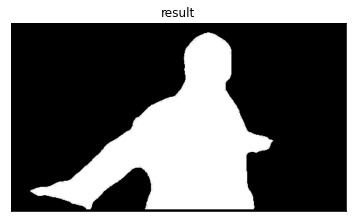

In [329]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

In [330]:
# 255와 0을 적당한 색상으로 바꾸어 줌
color_mask = cv2.applyColorMap(dilate, cv2.COLORMAP_JET)

(563, 1000, 3)


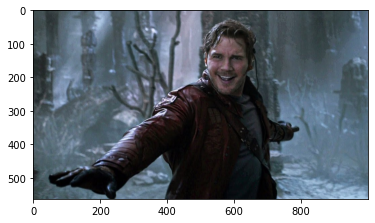

In [331]:
# 원본이미지 다시 가지고 오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

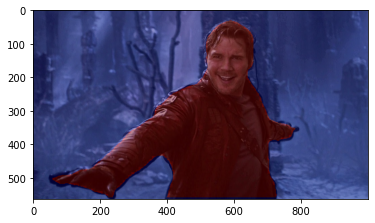

In [332]:
img_show = img_orig.copy()

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

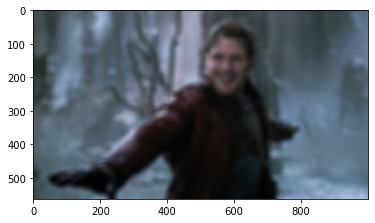

In [333]:
# (20,20)은 blurring kernel size 의미
img_orig_blur = cv2.blur(img_orig, (20,20))

plt.imshow(cv2.cvtColor(img_orig_blur, cv2.COLOR_BGR2RGB))
plt.show()

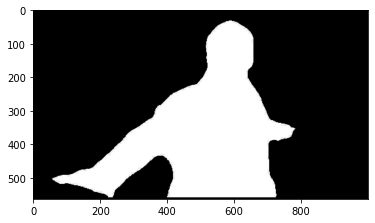

In [334]:
img_mask_color = cv2.cvtColor(dilate, cv2.COLOR_GRAY2BGR)

plt.imshow(img_mask_color)
plt.show()

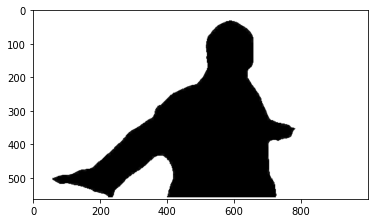

In [335]:
# 반전하기
img_bg_mask = cv2.bitwise_not(img_mask_color)
plt.imshow(img_bg_mask)
plt.show()

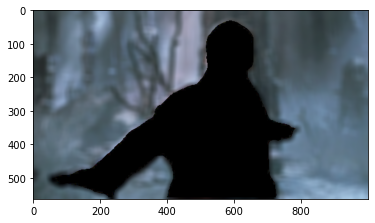

In [336]:
# 배경만 남기기
img_bg_blur = cv2.bitwise_and(img_orig_blur, img_bg_mask)
plt.imshow(cv2.cvtColor(img_bg_blur, cv2.COLOR_BGR2RGB))
plt.show()

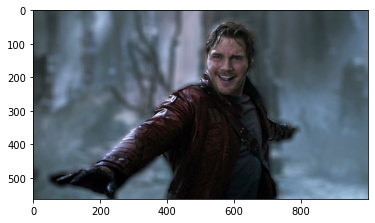

In [337]:
img_concat = np.where(img_mask_color==0, img_bg_blur, img_orig)

plt.imshow(cv2.cvtColor(img_concat, cv2.COLOR_BGR2RGB))
plt.show()

### <span style = "color:red;">결과</span>
 
흑백의 img mask에서는 침식 연산 패딩을 1로 했을 때와 7로 했을 때의 차이가 분명한데     
이미지에 합성했을 때에는 **큰 차이가 나지 않아 보인다.** 

### <span style = "color:red;">흑백의 img mask에 변화를 줄 수 있었다는 걸로 만족하나.. 침식연산을 해봤으니 팽창연산도 한 번 해보면?</span>

## Step 3-4. 흑백으로 나오는 segmentation된 mask 이미지로 팽창 연산 수행

### <span style = "color:orange;">DeepLabV3+ 모델로 segmentation한 흑백의 img_mask 불러오기</span>

In [343]:
from PIL import Image 
image_path_1_dilation = Image.open('aiffel/project/cheese/002.jpg')

### <span style = "color:orange;">팽창 연산 수행</span>

In [344]:
image_path_1_dilation = np.array(image_path_1_dilation.convert('L'))
print(image_path_1_dilation.shape)
(N,M) = image_path_1_dilation.shape

(563, 1000)


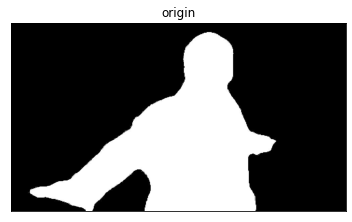

In [345]:
plt.subplot(1,1,1)
plt.title("origin")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(image_path_1_dilation, cmap = 'gray')

In [346]:
paddingImg = np.zeros((N+2, M+2), dtype=np.uint8)
paddingImg[1:1+N, 1:1+M] = image_path_1_dilation.copy()
dilate = np.zeros_like(image_path_1_dilation)

for i in range(0,N,1):
    for j in range(0,M,1):
        temp = paddingImg[i:i+7, j:j+7] # 7*7 mask로 적용
        dilate[i][j] = np.max(temp)

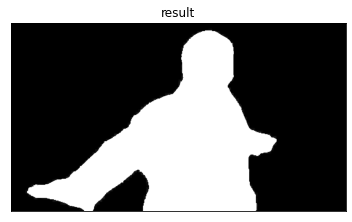

In [347]:
plt.subplot(1,1,1)
plt.title("result")
ax = plt.gca()
ax.axes.xaxis.set_visible(False)
ax.axes.yaxis.set_visible(False)
plt.imshow(dilate, cmap = 'gray')
plt.show()

### <span style = "color:red;">팽창연산 하기 전에 비해 흰색 영역(사람 영역)이 더 확대되었음을 알 수 있다.</span>

### <span style = "color:orange;">색 반전 이미지와 합치기</span>

In [348]:
# 255와 0을 적당한 색상으로 바꾸어 줌
color_mask = cv2.applyColorMap(dilate, cv2.COLORMAP_JET)

(563, 1000, 3)


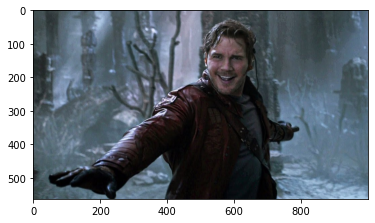

In [349]:
# 원본이미지 다시 가지고 오기
img_path = os.getenv('HOME')+'/aiffel/project/first-repository/[GD_4_Portrait] images/01.jpg'  
img_orig = cv2.imread(img_path) 
print(img_orig.shape)
plt.imshow(cv2.cvtColor(img_orig, cv2.COLOR_BGR2RGB))
plt.show()

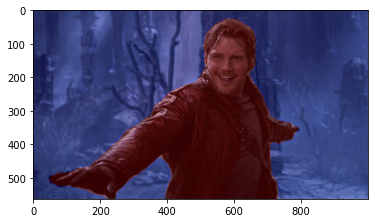

In [350]:
img_show = img_orig.copy()

img_show = cv2.addWeighted(img_show, 0.6, color_mask, 0.4, 0.0)

plt.imshow(cv2.cvtColor(img_show, cv2.COLOR_BGR2RGB))
plt.show()

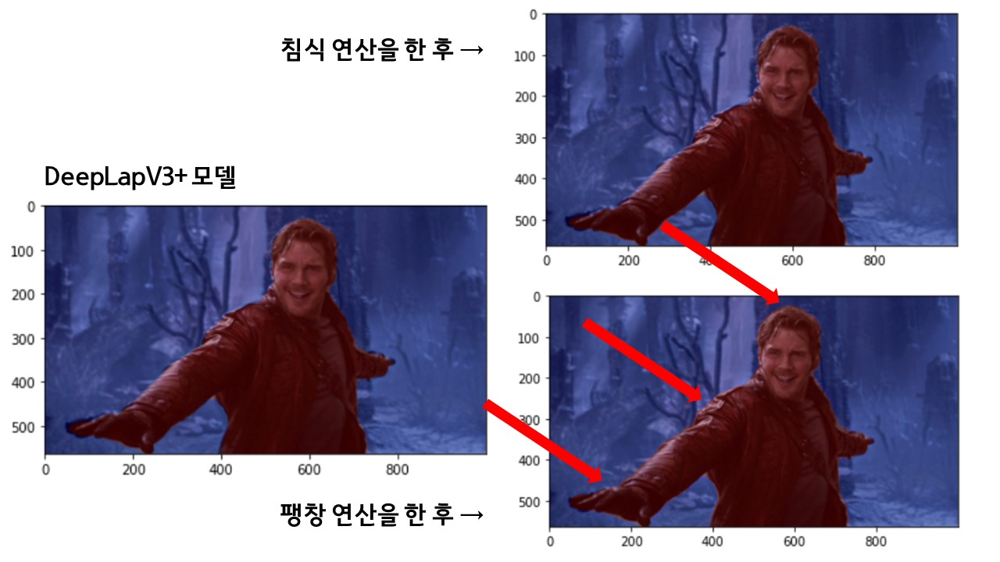

In [355]:
Image("[GD_4_Portrait] images/23.jpg")

### <span style = "color:red;">오오오!! 변화가 있다!</span>

위 사진처럼 손 일부, 왼쪽 어깨 일부, 머리 부분이 다르다.       
이전 img mask 보다 더 큰 img mask가 적용되어 사람을 더 잘 분류해 표시할 수 있는 img mask로 수정할 수 있음을 확인할 수 있다.   
뿌듯하다:)    

## Step 3-5. 문제점 개선에 영향이 있었던 팽창 연산 flow chart 정리

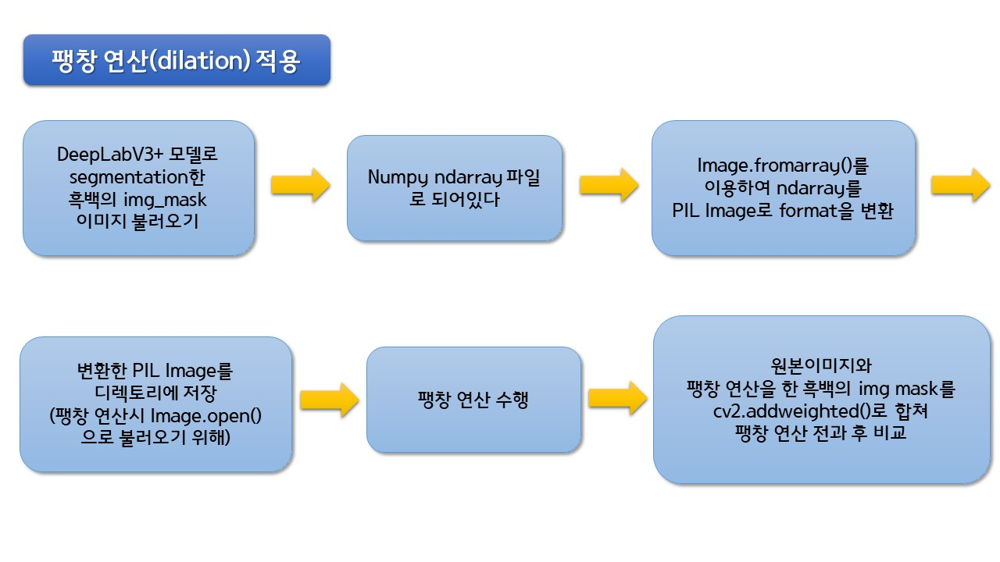

In [2]:
Image("[GD_4_Portrait] images/032.jpg")

# 4. 결론

1. DeepLabV3+ 모델을 활용해 다양한 사진들을 인물사진 모드로 만들어 보았다. 
2. 소에 대해서도 인물사진 모드로 만들어 보고, 실제 소와 그림 소를 같이 분류해보며 차이점을 찾아보았다.
3. 양탄자 탄 소 이미지를 만들어보며 배경을 다른 이미지로 합성하는 것도 해 보았다.
4. 다양한 인물사진 모드 결과물들을 보며 문제점들을 발견해보았다.
5. 그 중 일부분을 인식하지 못하는 부분에 대해 알아보던 중 이미지 팽창 연산과 침식 연산이 있다는 것을 알게 됨
6. 침식 연산과 팽창 연산을 segmentation된 img mask에 적용하여 변화를 살펴봄
7. 팽창 연산을 적용한 img mask는 이전 img mask보다 사람 영역을 잘 분류하는 마스크로 사용될 수 있음을 확인함

# 5. 루브릭 관련 고려한 점

**1. 인물모드 사진을 성공적으로 제작하였다.**    
아웃포커싱 효과가 적용된 인물모드 사진과 동물 사진, 배경전환 크로마키사진을 각각 1장 이상 성공적으로 제작하였다.     
(그렇다)
 
 
**2. 제작한 인물모드 사진들에서 나타나는 문제점을 정확히 지적하였다.**     
인물사진에서 발생한 문제점을 정확히 지적한 사진을 제출하였다.      
(그렇다)


**3. 인물모드 사진의 문제점을 개선할 수 있는 솔루션을 적절히 제시하였다.**     
semantic segmentation mask의 오류를 보완할 수 있는 좋은 솔루션을 이유와 함께 제시하였다.     
(좋은 솔루션인지는 모르겠으나, 방법을 찾아보고 도움이 될 수 있는 방법을 제시함)

# 6. 회고

### 1. 프로젝트에서 어려웠던 점, 해결을 위해 시도한 방법, 문제해결에 성공한 이유 또는 실패한 이유

- **프로젝트에서 어려웠던 점**  
    1. 디렉토리, ndarray를 PIL Image로 바꾸는 과정에서 Image.open 부분이 제일 어려웠다.     
    침식, 팽창 연산도 어려웠지만, 연산을 하기 위한 파일을 불러오고, 작업한 파일을 저장하는 부분에서 에러가 많이 나니    
    하나 오랜 시간을 들여 해결을 하고 나면 지금 무엇을 하고 있었지라며 하던 과정을 다시 확인하는 부분이 쉽지 않았다.
    
    2. 프로젝트를 정리하는 것
    혼자 실습해볼 때에 비해 단계별로 정리해야 하니 시간 소요도 많이 들고, 쉽지 않았다.
    
    3. 여러 경우의 수에 대해 실험해보다 보니, 해당하는 코드들을 가지고 오거나 작성하는 것이 어려웠다.    
    반복되어 쉽지 않을까 생각할 수도 있지만, 실험할 때마다 조건이 조금씩 달라지고,     
    그에 따라 단계별로 적용해야하는 코드가 다르기 때문에 내가 원래 전체 프로세스의 어느 부분의 코드가 필요한 건지를 계속 확인해야 했다.


- **해결을 위해 시도한 방법**  
    1. 인물사진을 만드는 전체적인 과정을 이해하려고 많이 공부함     
    2. 디렉토리, 저장, Image.open과 관련된 부분은 ChatGPT와 기술블로그, 유튜브 영상의 도움을 많이 받았다.


- **문제해결에 성공한 이유 또는 실패한 이유**  
    제일 기쁜 건, 3번 문제 개선 방안을 고민하고 해결방안을 도출하는 부분에 있어 어느정도 답할 수 있는 부분을 찾았다는 것이다.    
    마지막 팽창 연산해보기 전에는 아 침식 연산까지 한 거까지 하고 마무리하려고 했다.    
    원본이미지나 흐리게 된 이미지와 합쳤을 때에는 눈에 띄는 변화를 보기에는 어려웠지만    
    흑백으로 된 img mask에서는 달라지는 점을 확인할 수 있었기 때문이다.    
    하지만 지금까지 침식 연산만 사용했다는 걸 알고, 팽창 연산도 한 번만 해보자하고 적용해 보았다.    
    팽창 연산의 효과가 어느정도 있는 것 같아 뿌듯하지만,     
    **이렇게도 해볼까? 했을 때 아 그냥 이 정도만 하자 라고 할 수도 있었는데     
    좀 더 해보자라고 생각하고 하나씩 묵묵히 한 것이 도움이 된 것 같다.(시간도 많이 걸렸지만ㅎㅎ)**  
   

### 2. 프로젝트를 진행하면서 알아낸 점 혹은 아직 모호한 점

- **프로젝트를 진행하면서 알아낸 점**  
1. 이미지 팽창 연산과 침식 연산이 있다는 것
2. 디렉토리는 폴더라는 것
3. ndarray를 PIL Image format으로 변환할 수 있다는 것

### <span style = "color:orange;">아직 모호한 점, 더 탐구해보고 싶은 부분</span>

**seg_color를 설정할 때**    
튜플처럼 정해주면 되는건가?       
colormap[15]의 출력은 array형태로 [ ] 대괄호 안에 숫자들이 있는데, 형태가 같지 않은데 그래도 괜찮은가 하는 궁금증

**seg_map = np.all(output==seg_color, axis=-1)에서**    
axis=-1의 의미는??

**소 이미지의 shape은 (638, 960, 3)인데, image.resize()에서는 638과 960의 순서를 바꾸었다. 왜?**

**resized_array 이미지는 출력해보니 잘 나오는데..**

cv2.cvtColor(resized_array, cv2.COLOR_GRAY2BGR)는 에러가 난다. 왜일까?

# 7. References

import os        
https://wikidocs.net/3141     

import urllib         
https://dojang.io/mod/page/view.php?id=2442       

np.all()       
https://numpy.org/doc/stable/reference/generated/numpy.all.html     
https://nov19.tistory.com/106     

cv2.bitwise_and()     
https://velog.io/@dldndyd01/OpenCV-bitwiseand-or-xor-not-%EA%B8%B0%EB%8A%A5-%EC%A0%95%EB%A6%AC-RGB-Image     

디렉토리     
https://www.youtube.com/watch?v=6z7FVYXnk3E      

팽창 연산과 침식 연산    
https://blog.naver.com/jpjs1888/222526335501    